# Lab 2: Image Segmentation, Filter, Feature points

This week you learned about manipulating image color from the pixel values and histogram. In this session you will get some more experience coding image segmentation algorithms and filtering with pixel location information too. 

There are four parts and you should aim to finish first two parts in the lab sesion on Tuesday.

There are one task each for Part 1 and 2 and 4. Please complete them and submit them with the finished jupyter note book.

# Part 1 Segmentation

Your task will be to code a simple statistical method that uses Region growing or connected components.

## Task 1 K-means Segmentation


In previous task you have operated over all pixels in the image for computing histogram. In this session you will get some experience coding image segmentation algorithms. Your task will be to code a simple statistical method that uses k-means clustering on all pixels.

K-means clustering is a well-known approach for separating data (often of high dimensionality) into
different groups depending on their distance. In the case of images this is a useful method for
segmenting an image into regions, provided that the number of regions (k) is known in advance. It is
based on the fact that pixels belonging to the same region will most likely have similar intensities. 

The algorithm is:

a) Given the number of clusters, k, initialise their centres to some values.

b) Go over the pixels in the image and assign each one to its closest cluster according to its distance to the centre of the cluster.

c) Update the cluster centres to be the average of the pixels added.

d) Repeat steps b and c until the cluster centres do not get updated anymore.

In [84]:
# %matplotlib inline is a magic function for displaying the image in the notebook
%matplotlib inline
import numpy as np
import cv2
import copy
import matplotlib.image as mpimg
from matplotlib import pyplot as plt



### Task 1.1 Use the k-means function in sklearn and see results

First, you can use the built-in kmeans function in sklearn and see the results. 
You can figure out how to this from the specification: https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html

### Load image

Important Note: Don't forget to convert the image to float representation.

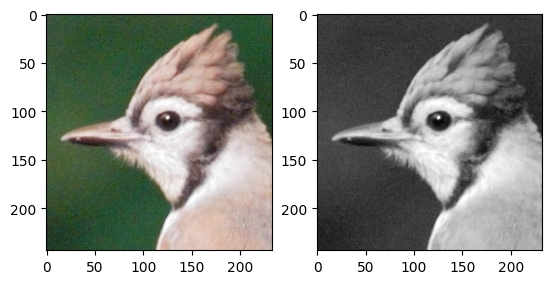

In [85]:
# Load image and conver to float representation
raw_img = cv2.imread("../dataset/sample_image.jpg") # Read the image
raw_gray_img = cv2.cvtColor(raw_img, cv2.COLOR_BGR2GRAY) # Convert the image to grayscale
img = raw_img.astype(np.float32) / 255. # Convert the image to float32 and divide by 255 to make intensities [0,1]
gray_img = raw_gray_img.astype(np.float32) / 255. # Convert the grayscale image to float32 and divide by 255 to make intensities [0,1]
plt.subplot(1, 2, 1) # Display the image
plt.imshow(img) # Display the image
plt.subplot(1, 2, 2) # Display the grayscale image
plt.imshow(gray_img, "gray") # Display the grayscale image

### Results on Gray-scale Image

[[0.76224256]
 [0.28945947]]


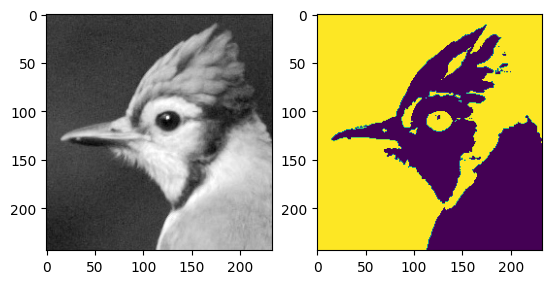

In [86]:
from sklearn.cluster import KMeans
# Flatten the image dimension first
gray_img_flat = gray_img.reshape(-1, 1) # Flatten the image
kmeans = KMeans(n_clusters=2, random_state=0).fit(gray_img_flat) # Fit the KMeans model with 2 clusters

H, W = gray_img.shape # Get the shape of the image
# Unflatten back
labels = kmeans.labels_.reshape(H, W) # Reshape the labels

# Plot the gray scale and the cluster image
plt.subplot(1, 2, 1) 
plt.imshow(gray_img, "gray") # Display the grayscale image
plt.subplot(1, 2, 2) 
plt.imshow(labels) # Display the labels (kmeans)

print(kmeans.cluster_centers_) # Display the cluster centers


[[0.7286137  0.7527624  0.82246923]
 [0.22156447 0.3262233  0.23835088]]


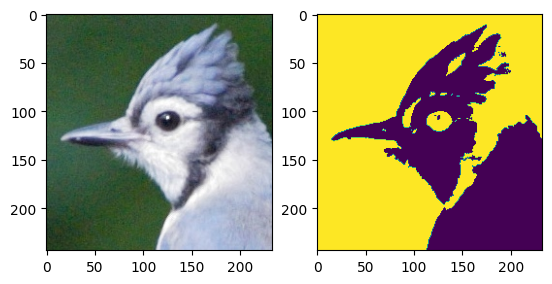

In [87]:
### Results on RGB image
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convert to RGB
img_flat = img_rgb.reshape(-1, 3) # Flatten the image

# Find the K means
kmeans = KMeans(n_clusters=2, random_state=0).fit(img_flat) # Fit the KMeans model
H, W, _ = img.shape # Get the shape of the image
# Unflatten back
labels = kmeans.labels_.reshape(H, W) # Reshape the labels

# Plot the gray scale and the cluster image
plt.subplot(1, 2, 1) 
plt.imshow(img_rgb) # Display the RGB image
plt.subplot(1, 2, 2) 
plt.imshow(labels) # Display the labels (kmeans)

print(kmeans.cluster_centers_) # Display the cluster centers

### Task 1.2 Implement your own k-means

Now you need to implement your own k-means function. Use your function on different greyscale images and try comparing the results to the results you get from sklearn kmeans function.

### Implement your own functions here:

In [88]:
def my_kmeans(I, k):
    """
    Parameters
    ----------
    I: the image to be segmented (greyscale to begin with) H by W array
    k: the number of clusters (use a simple image with k=2 to begin with)

    Returns
    ----------
    clusters: a vector that contains the final cluster centres
    L: an array the same size as the input image that contains the label for each of the image pixels, according to which cluster it belongs
    """
    assert len(I.shape) == 2, "Wrong input dimensions! Please make sure you are using a gray-scale image!"
    
    img_flat = I.reshape(-1, 1) # Flatten the Gray image 
    kmeans = KMeans(n_clusters=k, random_state=0).fit(img_flat)    # Fit the KMeans model
    # Reshape labels according to the original image shape
    H, W = I.shape # Get original image shape
    L = kmeans.labels_.reshape(H, W) # Reshape the labels
    # Get the cluster centers
    clusters = kmeans.cluster_centers_ 

    return clusters, L 

def my_kmeans_rgb(I, k):
    """
    Parameters
    ----------
    I: the image to be segmented (greyscale to begin with) H by W array
    k: the number of clusters (use a simple image with k=2 to begin with)

    Returns
    ----------
    clusters: a vector that contains the final cluster centres
    L: an array the same size as the input image that contains the label for each of the image pixels, according to which cluster it belongs
    """

    assert len(I.shape) == 3, "Wrong input dimensions! Please make sure you are using a RGB image!"
   
    img_flat = I.reshape(-1, 3) # Flatten the image Gray
    kmeans = KMeans(n_clusters=k, random_state=0).fit(img_flat)    # Fit the KMeans model  
    
    # Reshape labels according to the original image shape
    H, W, _ = I.shape # Get the shape of the image
    L = kmeans.labels_.reshape(H, W) # Reshape the labels. Each label has two dimensions.
    # Get the cluster centers
    clusters = kmeans.cluster_centers_ # Get the cluster centers
    
    return clusters, L


### Show results here:

[[0.76224256]
 [0.28945947]]


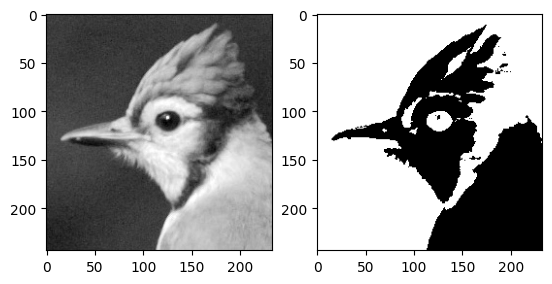

In [89]:
centroids, labels = my_kmeans(gray_img, 2)
# Plot the gray scale and the cluster image
plt.subplot(1, 2, 1) 
plt.imshow(gray_img, "gray") # Display the RGB image
plt.subplot(1, 2, 2) 
plt.imshow(labels,"gray") # Display the labels (kmeans)
print(centroids)
# [0.28945825 0.7622435 ]

### More things to try out:
1. Try different values for k. For k > 2 you will need some way to display the output L (other than simple black and white). Consider using a colour map with the imshow function.
2. Adapt your function so that it will handle colour dataset as well. What changes do you have to make?

[[0.6494627 ]
 [0.28190264]
 [0.8398917 ]]


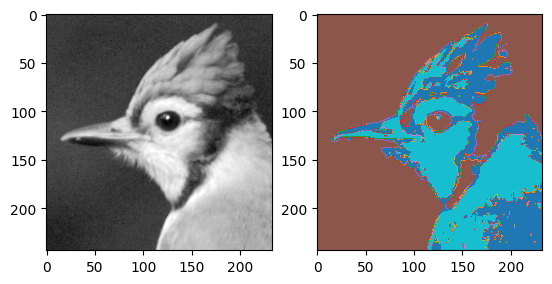

In [90]:
# k=3
centroids, labels = my_kmeans(gray_img, 3)
plt.subplot(1, 2, 1) 
plt.imshow(gray_img, "gray") # Display the RGB image
plt.subplot(1, 2, 2) 
plt.imshow(labels,cmap='tab10') # Display the labels (kmeans)
print(centroids)
# [0.28073347 0.6257318  0.8242718 ]

[[0.68087924 0.7146716  0.80488515]
 [0.20460248 0.31725827 0.211923  ]
 [0.42594162 0.4576295  0.5423273 ]
 [0.872845   0.8771845  0.90391535]]


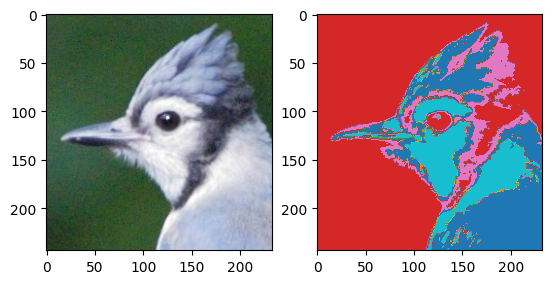

In [91]:
centroids, labels = my_kmeans_rgb(img_rgb, 4)

# Plot the gray scale and the cluster image
plt.subplot(1, 2, 1) 
plt.imshow(img_rgb) # Display the RGB image
plt.subplot(1, 2, 2) 
plt.imshow(labels,cmap='tab10') # Display the labels (kmeans)
print(centroids)

In [92]:
# to visualize the plots within the notebook
%matplotlib inline
# to enable interactive
#%matplotlib ipympl
import matplotlib.image as mpimg
from matplotlib import pyplot as plt
import random
from PIL import Image

## Task 2: Region growing
Region growing is a simple way to segment a region of interest from the background of an image.
It takes in a gray-scale image and produces a binary image as output, where a value of 1 represents the region of interest and a value of 0 represents the background.

The algorithm is:
1. Start from a seed pixel.
2. Add neighbouring pixels that satisfy the criteria defining a region (e.g. similar intensity values, intensity above a threshold).
3. Repeat until we can include no more pixels.

Your task is to write a function in Python that implements the region growing algorithm.
Something like:
```
  segmented_img = region_growing(img, x, y)
```

* img: the image to be segmented
* x: the x-coordinate (j if indexed by numpy array) of the seed pixel
* y: the y-coordinate (i if indexed by numpy array) of the seed pixel
* segmented_img: the binary image output of region growing

**Hint:** This is process basically a **Breadth-first Search (BFS)**, which could be easily implemented it with a **queue** (check out collections.deque in PyThon): 

1. Initialise the queue with the seed pixel. 
2. Every time pop the first element from the queue and add its neighbour pixels to the queue if they satisfy the criteria (e.g. intensity above the threshold).
3. Finish when the queue is empty

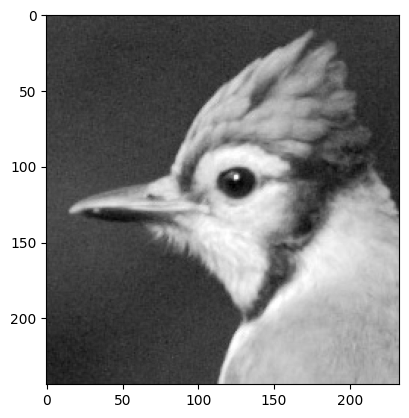

In [93]:
# Load your image
img = cv2.imread('../dataset/sample_image.jpg')
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)
plt.imshow(gray_img, 'gray')
plt.show()

In [94]:
from collections import deque
def region_growing(img, x, y, thresh=100, connectedness=4):
    '''
    Impelemnt region growing algorithm to segment a gray scaled image into regions
    :param img: gray scaled image [H, W]
    :param x, y: coordinate of the seed pixel
    :param thresh: region growing threshold
    :return: segmented image [H, W]
    ''' 
    assert img.ndim == 2, "Expect a gray-scale image!!!"
    H, W = img.shape # Get the height and width of original image
    segmented_image = np.zeros_like(img) # Create a zeros numpy array with the same size as the original image
    queue = deque([(y, x)]) # Create a queue with the starting pixel
    segmented_image[y,x] = 255  # Set the starting pixel to 255
    visited = set([y,x])  # Keep track of visited pixels
    
    # Directions: N, E, S, W (4-connectedness)
    if connectedness == 4:
        directions = [(-1, 0), (0, 1), (1, 0), (0, -1)]
    elif connectedness == 8:
        directions = [(-1, 0), (0, 1), (1, 0), (0, -1), (-1, 1), (1, 1), (1, -1), (-1, -1)]
    else:
        raise ValueError("Connectedness should be either 4 or 8!")
    
    # Get the intensity of the starting pixel
    start_intensity = img[y,x]
    threshold = thresh

    # Perform BFS
    while queue:
        # Get the current pixel
        current_pixel = queue.popleft() 
        # Get the current pixel coordinates
        r, c = current_pixel 
        
        # Explore neighbors
        for dr, dc in directions:
            # Get the neighbor coordinates
            nbor_r, nbor_c = r + dr, c + dc
            
            # Check if neighbor is within image bounds and not visited
            if 0 <= nbor_r < H and 0 <= nbor_c < W and (nbor_r, nbor_c) not in visited:
                # If intensity is within threshold range
                if abs(int(img[nbor_r, nbor_c]) - start_intensity) <= threshold:
                    # Add to queue
                    queue.append((nbor_r, nbor_c))
                    visited.add((nbor_r, nbor_c))
                    segmented_image[nbor_r, nbor_c] = 255  # Mark as part of the segment
    
    return segmented_image
    
    

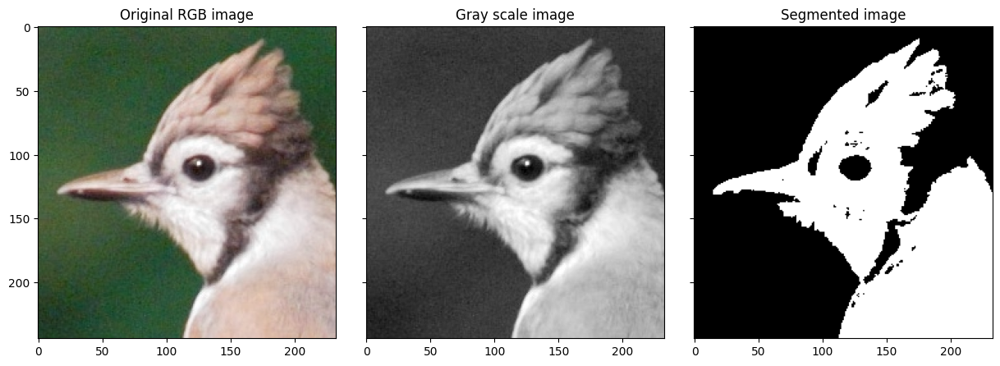

In [95]:
# define set of seed pixel points
#[(np.float64(121.94155844155843), np.float64(146.32251082251082)), (np.float64(190.59956709956708), np.float64(206.3982683982684)), (np.float64(77.04978354978353), np.float64(38.714285714285694))]

x, y = 100, 100

# run region growing algorithm
seg_img = region_growing(gray_img, x, y, thresh=75, connectedness=4)

# Show Original and segmented image
fig, axis = plt.subplots(1, 3, figsize=(15,10), sharey=True)
fig.subplots_adjust(wspace=0.1, hspace=0.05)
axis[0].imshow(img)
axis[0].set_title('Original RGB image')

axis[1].imshow(gray_img, 'gray')
axis[1].set_title('Gray scale image')

axis[2].imshow(seg_img, 'gray')
axis[2].set_title('Segmented image')
plt.show()

### There are two important factors that influence the performance of a region growing algorithm.

#### 1. The first is the seed pixel selection.
Try the following:
1. Pick a random pixel in the image.
2. Plot the histogram of the image, select a reasonable threshold and then search for a pixel whose intensity value is above the threshold (look for the `matplotlib.pyplot.hist()` function).
3. Do it manually (Hint: You can do this by enabling the interactive mode for `matplotlib`).

Which one is better?

(array([[  0.,  51., 181., ...,   0.,   0.,   0.],
        [  1.,  44., 187., ...,   0.,   0.,   0.],
        [  0.,  46., 183., ...,   0.,   0.,   0.],
        ...,
        [  0.,  74.,  50., ...,  56.,   0.,   0.],
        [  0.,  74.,  53., ...,  41.,   0.,   0.],
        [  0.,  86.,  43., ...,  38.,   0.,   0.]]),
 array([ 16.        ,  39.90000153,  63.79999924,  87.69999695,
        111.59999847, 135.5       , 159.3999939 , 183.30000305,
        207.19999695, 231.09999084, 255.        ]),
 <a list of 233 BarContainer objects>)

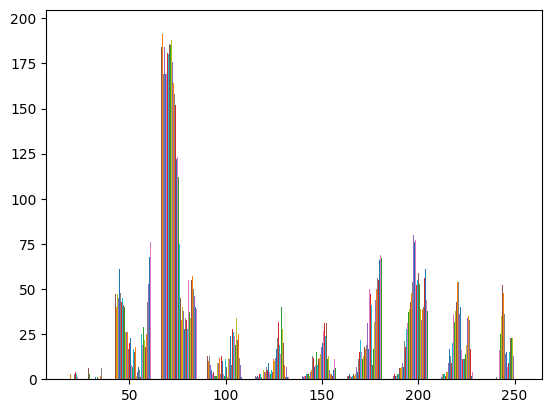

In [96]:
plt.hist(gray_img)

In [97]:
import matplotlib
# Turn on interactive mode
matplotlib.use('Agg')
# pick three points
%matplotlib tk  
plt.imshow(gray_img, 'gray')
x = plt.ginput(3) 
print(x)

%matplotlib inline 
#  go back to inline plot

# [(np.float64(121.94155844155843), np.float64(146.32251082251082)), (np.float64(190.59956709956708), np.float64(206.3982683982684)), (np.float64(77.04978354978353), np.float64(38.714285714285694))]


[]


#### 2. The second important factor is how to decide whether to add a neighbouring pixel to the existing region. 

Again, there are different options. Try the following alternatives:

1. Compare the pixel intensity value of the neighbours to a specified threshold (try the pixel intensity value of the initial seed pixel). If it is larger, then add it to the region. Depending on the seed pixel you might consider adding pixels with smaller intensities or even using a range of valid intensity values.
    
2. Compare the pixel intensity value of the neighbours to the average pixel intensity value of the existing region. The neighbour with the smallest difference to the average is added to the region. How will we stop adding neighbours to the region in this case?

Which one is better?

In [98]:
# Write your own code here
from collections import deque
def region_growing_avg(img, x, y, thresh=100, connectedness=4):
    '''
    Impelemnt region growing average algorithm to segment a gray scaled image into regions
    :param img: gray scaled image [H, W]
    :param x, y: coordinate of the seed pixel
    :param thresh: region growing threshold
    :return: segmented image [H, W]
    ''' 
    assert img.ndim == 2, "Expect a gray-scale image!!!"
    H, W = img.shape # Get the height and width of original image
    segmented_image = np.zeros_like(img) # Create a zeros numpy array with the same size as the original image
    queue = deque([(y, x)]) # Create a queue with the starting pixel
    segmented_image[y,x] = 255  # Set the starting pixel to 255
    visited = set([y,x])  # Keep track of visited pixels
    
    # Connectedness -> Directions (4 or 8)
    if connectedness == 4:
        # directions: N, E, S, W
        directions = [(-1, 0), (0, 1), (1, 0), (0, -1)] 
    elif connectedness == 8:
        # directions: N, NE, E, SE, S, SW, W, NW
        directions = [(-1, 0), (-1, 1), (0, 1), (1, 1), (1, 0), (1, -1), (0, -1), (-1, -1)]
    else:
        raise ValueError("Connectedness should be either 4 or 8!")
    
    # Get the intensity of the starting pixel

    start_intensity = img[y,x]
    numInt = 1
    sum_intensity = start_intensity
    avrg_intensity = sum_intensity/numInt
    threshold = thresh

    # Perform BFS
    while queue:
        # Get the current pixel
        current_pixel = queue.popleft() 
        # Get the current pixel coordinates
        r, c = current_pixel 
        
        # Explore neighbors
        for dr, dc in directions:
            # Get the neighbor coordinates
            nbor_r, nbor_c = r + dr, c + dc
            
            # Check if neighbor is within image bounds and not visited
            if 0 <= nbor_r < H and 0 <= nbor_c < W and (nbor_r, nbor_c) not in visited:
                # If intensity is within threshold range
                if abs(int(img[nbor_r, nbor_c]) - avrg_intensity) <= threshold:
                    # Add to queue
                    queue.append((nbor_r, nbor_c))
                    visited.add((nbor_r, nbor_c))
                    segmented_image[nbor_r, nbor_c] = 255  # Mark as part of the segment
                    numInt += 1
                    sum_intensity+=img[nbor_r, nbor_c]
                    avrg_intensity = sum_intensity/numInt
                    
    
    return segmented_image
    
    


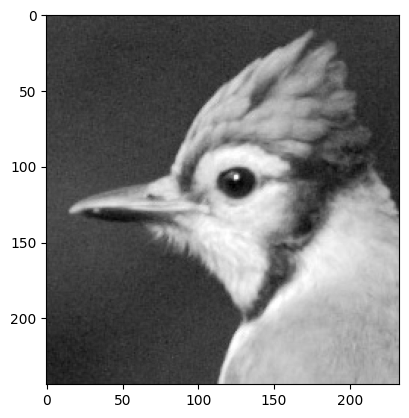

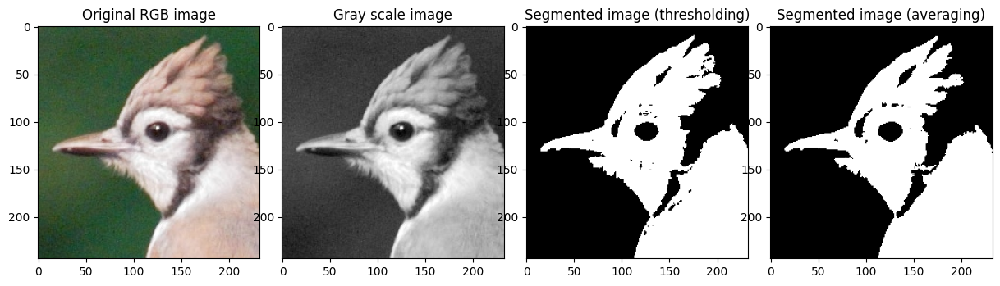

In [99]:
# define set of seed pixel points
x, y = 100, 100

# run region growing algorithm
seg_img = region_growing(gray_img, x, y, thresh=75, connectedness=4)
seg_img2 = region_growing_avg(gray_img, x, y, thresh=75, connectedness=4)

# Show Original and segmented image
fig, axis = plt.subplots(1, 4, figsize=(15,15))
fig.subplots_adjust(wspace=0.1, hspace=0.05)
axis[0].imshow(img)
axis[0].set_title('Original RGB image')

axis[1].imshow(gray_img, 'gray')
axis[1].set_title('Gray scale image')

axis[2].imshow(seg_img, 'gray')
axis[2].set_title('Segmented image (thresholding)')

axis[3].imshow(seg_img2, 'gray')
axis[3].set_title('Segmented image (averaging)')
plt.show()

### More things to try out:
1. What kind of connectivity did you use for considering neighbour pixels? If you used 4- connectivity, try 8-connectivity, if you used 8-connectivity then try 4-connectivity.
    Does this change results?
    
2. What if there are multiple regions of interest? Consider using multiple seed points. How will you choose these?

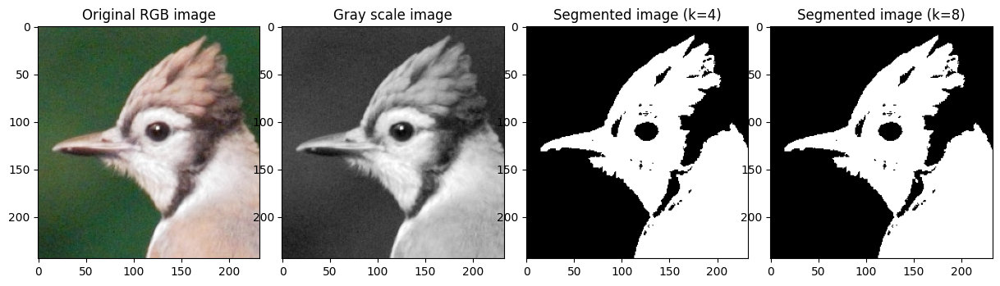

In [100]:
# define set of seed pixel points
x, y = 100, 100

# run region growing algorithm
seg_img = region_growing(gray_img, x, y, thresh=75, connectedness=4)
seg_img2 = region_growing(gray_img, x, y, thresh=75, connectedness=8)

# Show Original and segmented image
fig, axis = plt.subplots(1, 4, figsize=(15,15))
fig.subplots_adjust(wspace=0.1, hspace=0.05)
axis[0].imshow(img)
axis[0].set_title('Original RGB image')

axis[1].imshow(gray_img, 'gray')
axis[1].set_title('Gray scale image')

axis[2].imshow(seg_img, 'gray')
axis[2].set_title('Segmented image (k=4)')

axis[3].imshow(seg_img2, 'gray')
axis[3].set_title('Segmented image (k=8)')
plt.show()

## Task 3: Connected Components 

Connected-component labeling (also known as connected-component analysis, or region labeling) is an algorithmic application of graph theory that is used to determine the connectivity of “blob”-like regions in a binary image.
Specifically, the algorithm labels each connected component of a binary image with a separate number.

Similar to Region Growing, for a single connected-component we can start from a seed and iteratively traverse all the neighbouring pixels. In this case, a Depth-first Search (DFS) is a better way:

Then we just need to repeat this process for all the connected components in the image.

In [101]:
def connected_components_label(img, connectedness=4):
    '''
    Implement connected components labeling algorithm to segment a binary image into regions
    :param img: binary image [H, W]
    :return: segmented image [H, W]
    ''' 
    assert img.ndim == 2, "Expect a binary image!!!"

    H, W = img.shape # Get the height and width of original image
    segmented_image = np.zeros_like(img) # Create a zeros numpy array with the same size as the original image
    visited = set()  # Keep track of visited pixels : Set is an unordered collection of unique elements.
    label = 0  # Initialize label
    
    # Connectedness -> Directions (4 or 8)
    if connectedness == 4:
        # directions: N, E, S, W
        directions = [(-1, 0), (0, 1), (1, 0), (0, -1)] 
    elif connectedness == 8:
        # directions: N, NE, E, SE, S, SW, W, NW
        directions = [(-1, 0), (-1, 1), (0, 1), (1, 1), (1, 0), (1, -1), (0, -1), (-1, -1)]
    else:
        raise ValueError("Connectedness should be either 4 or 8!")
    

    # Perform DFS
    # For each pixel in the image

    for r, c in np.ndindex(H, W): # Iterate over the image pixels

        # If the pixel is foreground (1) and not visited, start a new connected component
        if img[r, c] == 1 and (r, c) not in visited:

            # Increment the label for the new connected component
            label += 1 
            # Add the current pixel to the stack to start the DFS and mark it as visited
            stack = [(r, c)] 
            visited.add((r, c)) 
            
            # Check the neighbors of the current pixel
            # and keep adding the neighbors to the stack until there are no more neighbors to add
            # when the stack is empty, the connected component is fully explored, exit the while loop
            # and continue to the next pixel in the image
            while stack: 
                # Get the current element from the stack
                current_pixel = stack.pop() 
                r, c = current_pixel
                # Assign the label to the current pixel
                segmented_image[r, c] = label

                # Explore neighbors of the current pixel: [N, E, S, W], or [N, NE, E, SE, S, SW, W, NW]
                for dr, dc in directions: 
                    # Get the neighbor coordinates
                    nbor_r, nbor_c = r + dr, c + dc 
                    # Check if neighbor is within image bounds and not visited and is foreground (1)
                    if 0 <= nbor_r < H and 0 <= nbor_c < W and (nbor_r, nbor_c) not in visited and img[nbor_r, nbor_c] == 1:
                        # Add the neighbor to the stack
                        stack.append((nbor_r, nbor_c))
                        # Mark the neighbor as visited
                        visited.add((nbor_r, nbor_c))
                        
    return segmented_image, label



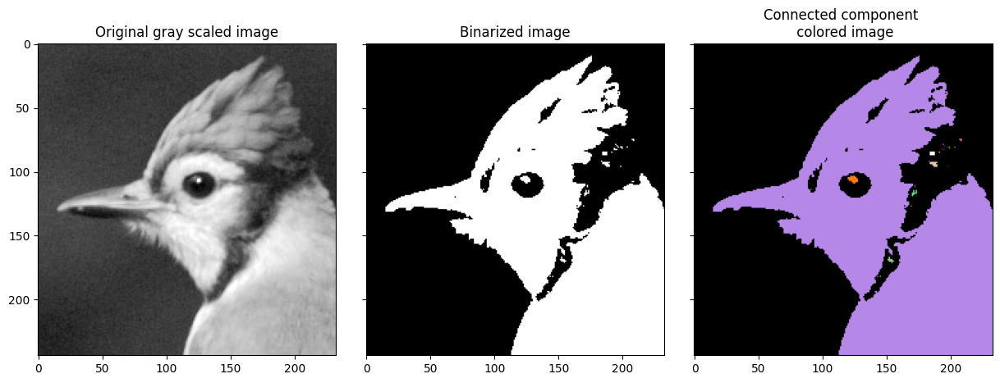

In [102]:
from utils import colourize

bimg = (gray_img > 100).astype(np.float32)
ccl_img, _ = connected_components_label(bimg, connectedness=4)

fig, axis = plt.subplots(1, 3, figsize=(15,10), sharey=True)
fig.subplots_adjust(wspace=0.1, hspace=0.05)
axis[0].imshow(gray_img, 'gray')
axis[0].set_title('Original gray scaled image')

axis[1].imshow(bimg, 'gray')
axis[1].set_title('Binarized image')

axis[2].imshow(colourize(ccl_img))
axis[2].set_title('Connected component \n colored image')
plt.show()

The previous image was not a very good example to showcase the connected component algorithm. Next, you will see a better image.

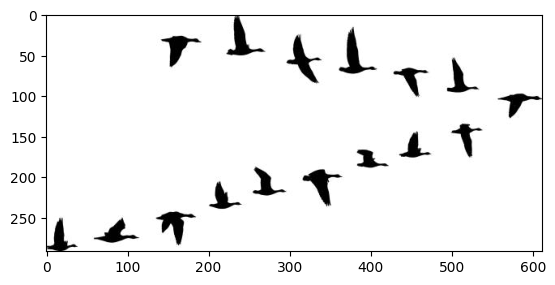

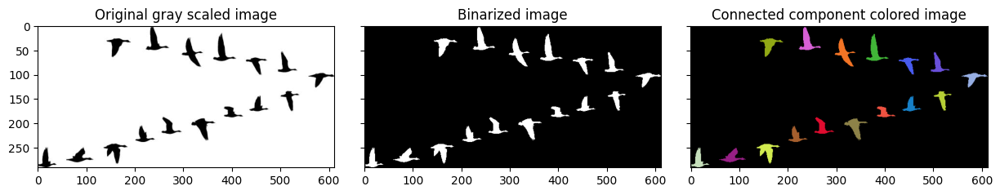

In [103]:
img2 = cv2.imread("../dataset/gooses.jpg")
gray_img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY).astype(np.float32)
plt.imshow(gray_img2, 'gray')

bimg2 = (gray_img2 < 100).astype(np.float32)
ccl_img2, _ = connected_components_label(bimg2)

fig, axis = plt.subplots(1, 3, figsize=(15,10), sharey=True)
fig.subplots_adjust(wspace=0.1, hspace=0.05)
axis[0].imshow(gray_img2, 'gray')
axis[0].set_title('Original gray scaled image')

axis[1].imshow(bimg2, 'gray')
axis[1].set_title('Binarized image')

axis[2].imshow(colourize(ccl_img2))
axis[2].set_title('Connected component colored image')
plt.show()

### Tasks
Your task is to count the number of candies in the image below (Candy1):
1. Show your code and intermediate results for each step
2. Explain how the parameters were selected and what prior information you use.
3. Report your answer
4. Try your code on Candy2 without anychanges and report reuslt, discuss how would you improve the method for them.

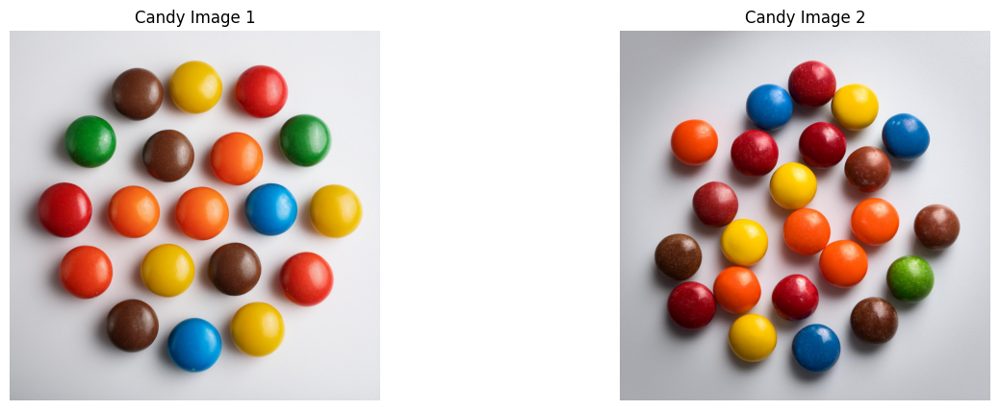

Number of candies in image 1: 21
Number of candies in image 2: 4


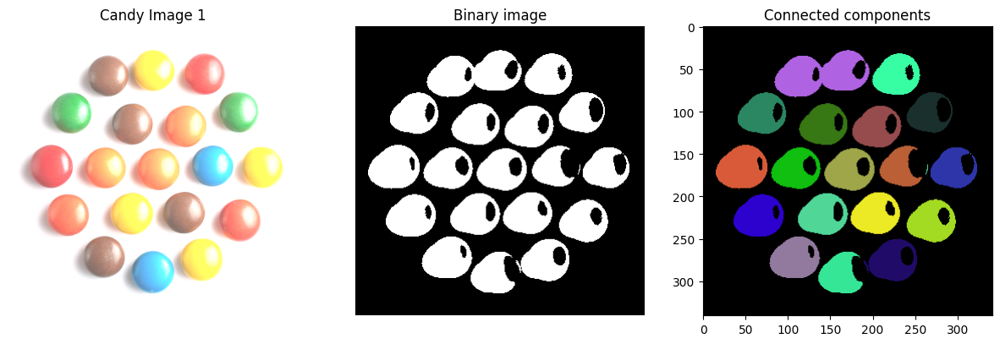

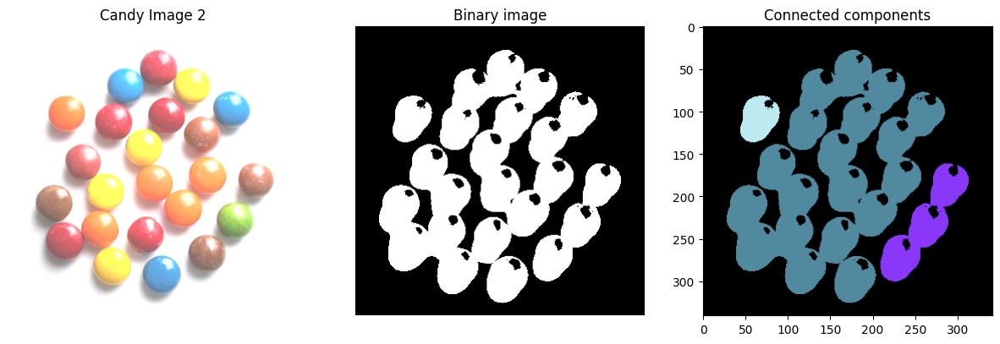

In [104]:
def average_scale_down(img,scl):
    '''
    Scale down and RGB image
    :param img: RBG image with size HxWx3
    :return: scaled_img: RBG scaled down image with size (H/4)x(W/4)x3
    '''
    # Create a local deep copy to be used 
    # to avoid changing the original image
    img_local = copy.deepcopy(img)

    assert len(img_local.shape) == 3, f'Wrong input image dimensions, we expected an input of size HxWxC instead we got {img.shape}'
    h,w,c = img_local.shape

    scale = scl
    h_scaled = h//scale
    w_scaled = w//scale

    # Create an empty list with x columns, y rows, and z=3 (channels)
    
    img_num = np.array(img_local)
    img_scl = img_local[:h_scaled, :w_scaled, :]
    
    for r in range(h_scaled):
        for c in range(w_scaled):
            st_r = r*scale
            ed_r = st_r + scale - 1
            st_c = c*scale
            ed_c = st_c + scale - 1
            
            ed_r = min(ed_r, h)
            ed_c = min(ed_c, h)

            img_scl[r,c,0] = np.mean(img_num[st_r:ed_r,st_c:ed_c,0])
            img_scl[r,c,1] = np.mean(img_num[st_r:ed_r,st_c:ed_c,1])
            img_scl[r,c,2] = np.mean(img_num[st_r:ed_r,st_c:ed_c,2])

    # assert scaled_img.shape == (h//2,w//2, 3), f'Wrong spacial dimensions, your method should reduce the spacial dimensions by a factor of four we expect {(h//2,w//2, 3)} instead we have {scaled_img.shape}'
    return img_scl

def process_img(image):
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Create a mask where the colored regions are separated from gray/white background
    # Assuming that the colored regions have a saturation value greater than 0
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    mask = cv2.inRange(hsv, (0, 0, 50), (180, 255, 255))

    # Create an inverted mask for the grayscale part
    mask_inv = cv2.bitwise_not(mask)

    # Keep only the colored foreground
    foreground = cv2.bitwise_and(image, image, mask=mask)

    # Enhance the foreground (increase brightness and saturation)
    hsv_foreground = cv2.cvtColor(foreground, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv_foreground)
    s = cv2.add(s, 50)  # Increase saturation
    v = cv2.add(v, 50)  # Increase brightness
    enhanced_foreground = cv2.merge([h, s, v])
    enhanced_foreground = cv2.cvtColor(enhanced_foreground, cv2.COLOR_HSV2BGR)

    # Combine enhanced foreground with grayscale background
    background = cv2.bitwise_and(gray, gray, mask=mask_inv)
    background = cv2.cvtColor(background, cv2.COLOR_GRAY2BGR)
    result = cv2.add(enhanced_foreground, background)

    return result
    

# Read first candy image
img1 = cv2.imread('../dataset/candy1.jpeg')
# Convert BGR to RGB for correct color display
img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

# Read second candy image
img2 = cv2.imread('../dataset/candy2.jpeg')
# Convert BGR to RGB for correct color display
img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

# Create figure with two subplots side by side
plt.figure(figsize=(15, 5))

# Display first image
plt.subplot(1, 2, 1)
plt.imshow(img1_rgb)
plt.title('Candy Image 1')
plt.axis('off')

# Display second image
plt.subplot(1, 2, 2)
plt.imshow(img2_rgb)
plt.title('Candy Image 2')
plt.axis('off')
plt.show()

########### Pre Processing Parameters ################
# Image Saturation
sat = 100
# Image downscale factor
scale = 6
# Single threshold or range
range_or_single = 0 # 0 for single threshold, 1 for range
# Binary Thresholding
bThres = 230
# Thresholding range
bThres_mid = 100
bThres_var = 100
bThres_max = 230 #int(bThres_mid + bThres_var/2)
bThres_min = 130  #int(bThres_mid - bThres_var/2)


############## Counting Candies in image 1 ################
img1_rgb = cv2.add(img1_rgb, sat)
# Convert image to gray scale
scaled_img1 = average_scale_down(img1_rgb, scale)
gray_img1 = cv2.cvtColor(scaled_img1, cv2.COLOR_BGR2GRAY).astype(np.float32)
## Filter the image: scale down by a factor of 4
# Convert gray scale image to binary
# If intensity is between min and max threshold, set to 1
if range_or_single:
    binary_img1 = ((gray_img1 > bThres_min) & (gray_img1 < bThres_max)).astype(np.float32)
else:
    binary_img1 = (gray_img1 < bThres).astype(np.float32)

# Get connected components
comps_img1, num = connected_components_label(binary_img1, connectedness=8)
# Create a subplot with 3 images
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(img1_rgb)
plt.title('Candy Image 1')
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(binary_img1, 'gray')
plt.title('Binary image')
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(colourize(comps_img1))
plt.title('Connected components')

print(f"Number of candies in image 1: {num+1}")

############## Counting Candies in image 2 ################
img2_rgb = cv2.add(img2_rgb, sat)
# Convert image to gray scale
scaled_img2 = average_scale_down(img2_rgb, scale)
gray_img2 = cv2.cvtColor(scaled_img2, cv2.COLOR_BGR2GRAY).astype(np.float32)
# Convert gray scale image to binary

if range_or_single:
    binary_img2 = ((gray_img2 > bThres_min) & (gray_img2 < bThres_max)).astype(np.float32)
else:
    binary_img2 = (gray_img2 < bThres).astype(np.float32)

# Get connected components
comps_img2, num = connected_components_label(binary_img2, connectedness=8)
# Create a subplot with 3 images
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(img2_rgb)
plt.title('Candy Image 2')
plt.axis('off')
plt.subplot(1, 3, 2)
plt.imshow(binary_img2, 'gray')
plt.title('Binary image')
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(colourize(comps_img2))
plt.title('Connected components')

print(f"Number of candies in image 2: {num+1}")


# Part 2: Filter
In the last lecture you learned about linear image filtering operations like correlation and
convolution and how these can be applied directly on the image.
These kind of filtering operations have many uses, ranging from smoothing and noise
reduction, to feature enhancement and sharpening, calculating image derivatives, edge
detection and even template matching.
Your task today is to code your own linear filtering functions operating on the image domain.

In [11]:
import numpy as np
import cv2
import matplotlib.image as mpimg
from matplotlib import pyplot as plt
# to visualize the plots within the notebook
%matplotlib inline

## Task 4 Convolution
Convolution is a fundamental operation for applying linear filters to images. It takes as input
an image (greyscale) I and a filter kernel K and returns the result I’ of convolving the image
with this filter.

Definition: Given a greyscale image I and a filter K of size (2N + 1)x(2M + 1) (we use odd
dimension filters like 3 x 3, 5 x 5 etc.), convolution is defined as:

\begin{equation}
I'(x, y) = \sum_{i=-N}^N \sum_{j=-M}^M K(i, j) I(x - i, y - j)
\end{equation}

Your task is to write your own convolution function (do not use the conv2() function) and test
it with different filters. How will you handle the behaviour of the filter in the edges of the
image (pad with zeros, copy the edge etc.)?

Smoothing filters that reduce noise in images are quite useful in image processing. Use a
simple mean filter like:

\begin{equation}
\begin{bmatrix}1 & 1 & 1\\1 & 1 & 1\\1 & 1 & 1\end{bmatrix}
\end{equation}

This filter replaces each pixel by the average of its neighbourhood. Now if we want
something better, we can try weighing the contributions of the neighbouring pixels by their
proximity to the centre pixel. Try a Gaussian filter, which is defined as: 

\begin{equation}
G_{\sigma} = \frac{1}{2\pi \sigma^2} e^{-\frac{(x^2 + y^2)}{2 \sigma^2}}
\end{equation}

where $\sigma$ is the standard deviationof the Gaussian. This is a continuous function, so your filter will need to sample it in both x and y directions (use np.meshgrid()), keeping in mind the value for $\sigma$ that you chose. Try different filter sizes and different values for $\sigma$ and compare the results. Here is the results obtained using opencv built-in functions. If your implementation is correct, you should expect to have similar results.

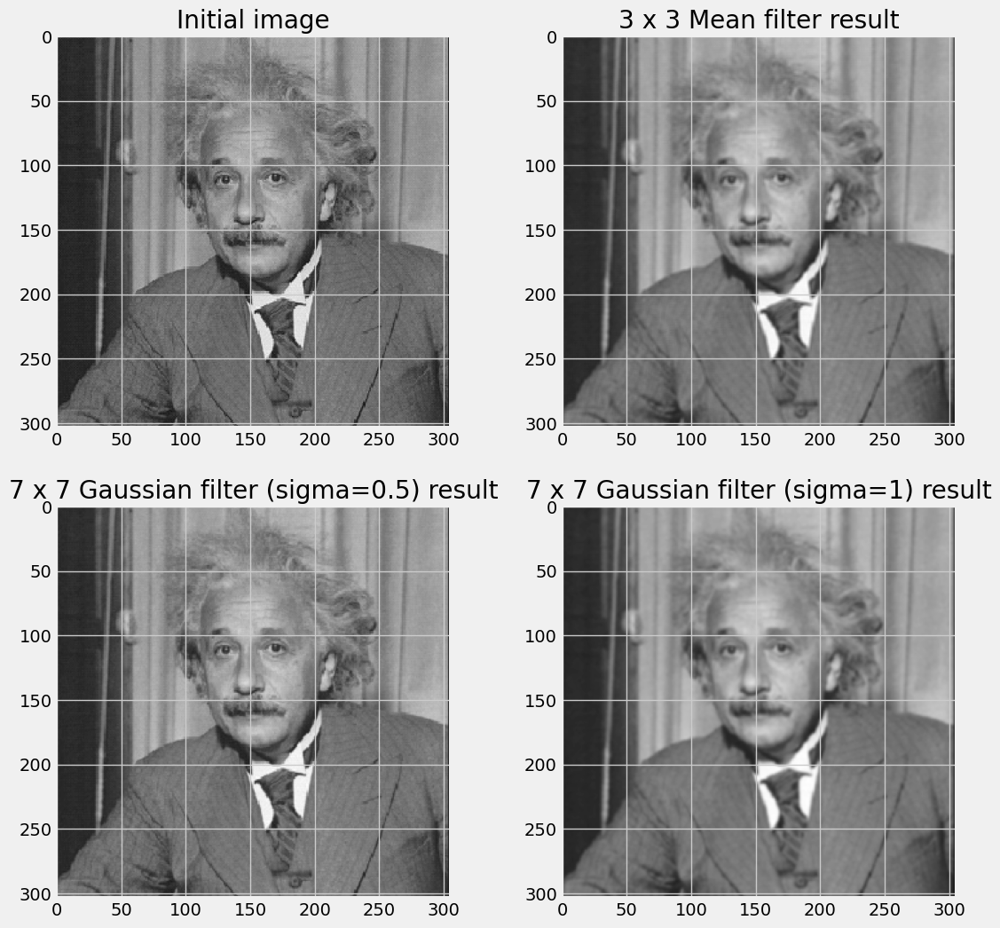

In [12]:
img = cv2.imread("../dataset/einstein.png")
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)
mean_blur = cv2.blur(img_gray, (3, 3))  # mean filter 3x3
gaussian_1 = cv2.GaussianBlur(img_gray, (7, 7), 0.5, 0.5)  # gaussian filter 7x7, sigma = 0.5
gaussian_2 = cv2.GaussianBlur(img_gray, (7, 7), 1., 1.)  # gaussian filter 7x7, sigma = 1.0
fig = plt.figure(figsize=(12, 12))
ax1 = plt.subplot(2, 2, 1)
ax1.title.set_text("Initial image")
plt.imshow(img_gray, "gray")
ax2 = plt.subplot(2, 2, 2)
ax2.title.set_text("3 x 3 Mean filter result")
plt.imshow(mean_blur, "gray")
ax3 = plt.subplot(2, 2, 3)
ax3.title.set_text("7 x 7 Gaussian filter (sigma=0.5) result")
plt.imshow(gaussian_1, "gray")
ax4 = plt.subplot(2, 2, 4)
ax4.title.set_text("7 x 7 Gaussian filter (sigma=1) result")
plt.imshow(gaussian_2, "gray")
plt.show()

### Implement your own code here:

hint: You can use `cv2.copyMakeBorder` to do paddings to the image. Figure out how to use it by yourself!

In [13]:
"""
Implement your code here
"""
def apply_filter(src_img, kernel):
    '''
    Implement filtering algorithm
    :param src_img: gray scaled source image with size HxW
    :param kernel: kernel to be applied to the source image
    :return rst_img: filtered image
    '''    
    assert len(src_img.shape) == 2, print("Dimension mismatch! Please supply gray-scale image only!")
    assert len(kernel.shape) == 2, print("Dimension mismatch! Please supply 2D kernel only!")
    Kn, Km = kernel.shape
    assert (Kn % 2 == 1) and (Km % 2 == 1), print("kernal size must be odd number!")
    N = (Kn - 1)//2 
    M = (Km - 1)//2

    I = copy.deepcopy(src_img) # Copy original image
    Id = np.zeros_like(I) # Filtered Image Holder
    Iaug = cv2.copyMakeBorder(I, N, N, M, M, borderType=cv2.BORDER_REPLICATE) # Expanded I image
    
    H, W = I.shape
    
    # for each pixel 
    for i in range(N,H):
        for j in range(M,W):
            segment = Iaug[i-N:i+N+1, j-M:j+M+1]
            # print(f'segment is of shape{segment.shape}')
            Id[i,j] = np.sum(segment * kernel) # Multiply and add segment end kernel elements

    return Id
            
    
def get_mean_filter_kernel(h, w):
    '''
    Get kernel of mean filter
    '''
    assert (h % 2 == 1) and (w % 2 == 1), print("kernal size must be odd number!")
    return np.ones((h,w))/(h*w)

def get_gaussian_kernel(h, w, sigma):
    '''
    Get kernel of Gaussian filter
    '''
    assert (h % 2 == 1) and (w % 2 == 1), print("kernal size must be odd number!")
    kernel = np.zeros((h,w))
    x_mid = (h-1)/2 # Center of the rows
    y_mid = (w-1)/2 # Center of the columns
    const = (1/ (2 * np.pi * sigma**2)) # Normalising Constant in the Guassian
    
    for x in range(h):
        for y in range(w):
            dx = x - x_mid
            dy = y - y_mid
            dx2_dy2 = dx**2 + dy**2
            kernel[x,y] = const*np.exp(-dx2_dy2/(2*sigma**2))

    # Normalize the kernel so that the sum of all its elements equals 1
    return kernel / np.sum(kernel)
    
def get_gaussian_kernel_mesh(h, w, sigma):
    '''
    Get kernel of Gaussian filter
    '''
    assert (h % 2 == 1) and (w % 2 == 1), print("kernal size must be odd number!") # Check if kernel size is odd
    x_mid = (h-1)/2 # Center of the rows
    y_mid = (w-1)/2 # Center of the columns
    # x = np.arange(-(h // 2), h // 2 + 1, 1.) # Create x values
    # y = np.arange(-(w // 2), w // 2 + 1, 1.) # Create y values
    x = np.arange(-x_mid, x_mid + 1, 1.) # Create x values
    y = np.arange(-y_mid, y_mid + 1, 1.) # Create y values
    X, Y = np.meshgrid(x, y) # Create meshgrid: all possible combinations of x and y
    kernel = np.exp(-(X**2 + Y**2) / (2 * sigma**2)) / (2 * np.pi * sigma**2) # Calculate Gaussian kernel
    kernel /= kernel.sum() # Normalize the kernel
    return kernel



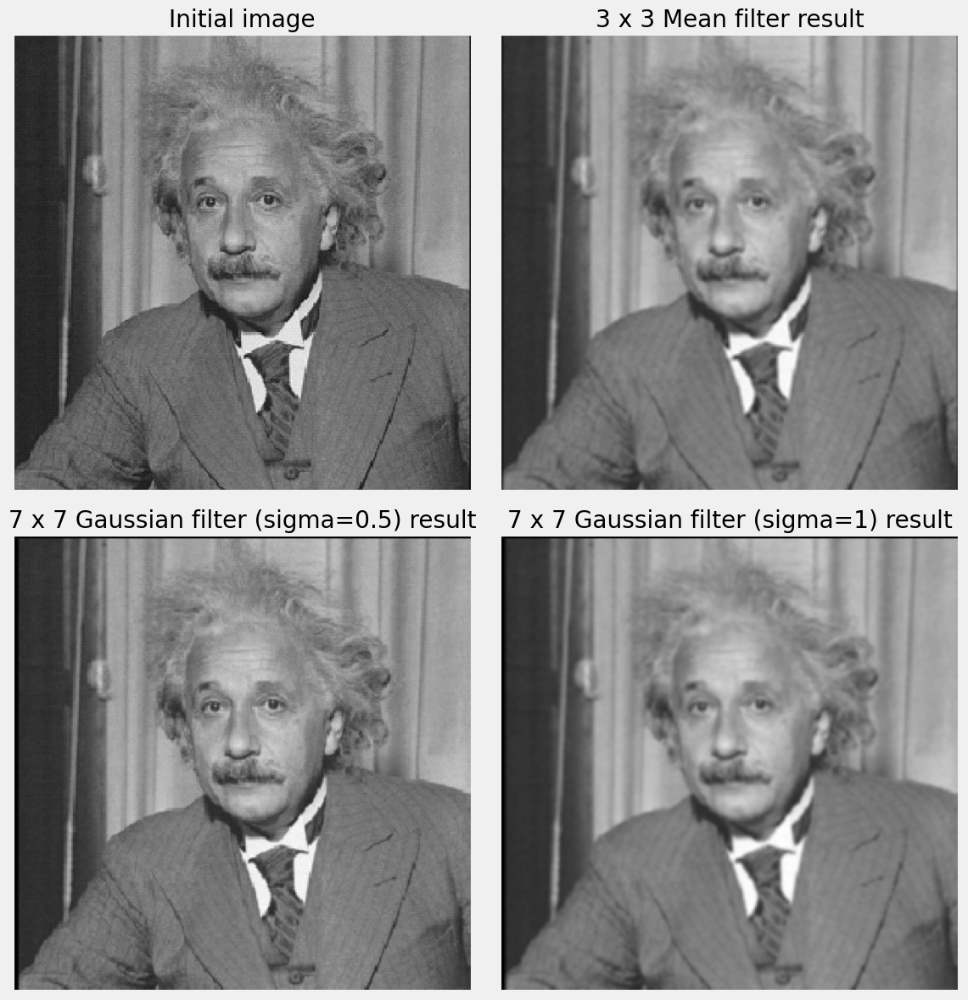

In [14]:

"""
Get kernels and apply filter here
"""
k_mean_dim = 3
k_gaus_dim = 7

img = cv2.imread("../dataset/einstein.png")
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)
# print(img_gray.shape)
K = get_mean_filter_kernel(k_mean_dim, k_mean_dim)
G1 = get_gaussian_kernel(k_gaus_dim, k_gaus_dim, 0.5)
G2 = get_gaussian_kernel(k_gaus_dim, k_gaus_dim, 1.)
img_mean_blur = apply_filter(img_gray, K)
img_gaussian_1 = apply_filter(img_gray, G1)
img_gaussian_2 = apply_filter(img_gray, G2)


"""
Plot the results
"""
fig = plt.figure(figsize=(12, 12))
ax1 = plt.subplot(2, 2, 1)
ax1.title.set_text("Initial image")
plt.xticks([])
plt.yticks([])
plt.imshow(img_gray, "gray")
ax2 = plt.subplot(2, 2, 2)
ax2.title.set_text("3 x 3 Mean filter result")
plt.xticks([])
plt.yticks([])
plt.imshow(img_mean_blur, "gray")
ax3 = plt.subplot(2, 2, 3)
ax3.title.set_text("7 x 7 Gaussian filter (sigma=0.5) result")
plt.xticks([])
plt.yticks([])
plt.imshow(img_gaussian_1, "gray")
ax4 = plt.subplot(2, 2, 4)
ax4.title.set_text("7 x 7 Gaussian filter (sigma=1) result")
plt.xticks([])
plt.yticks([])
plt.imshow(img_gaussian_2, "gray")

plt.tight_layout()
figName = "../dataset/Lab2/Part2/main_methods_comparison.png"
plt.savefig(figName)

plt.show()

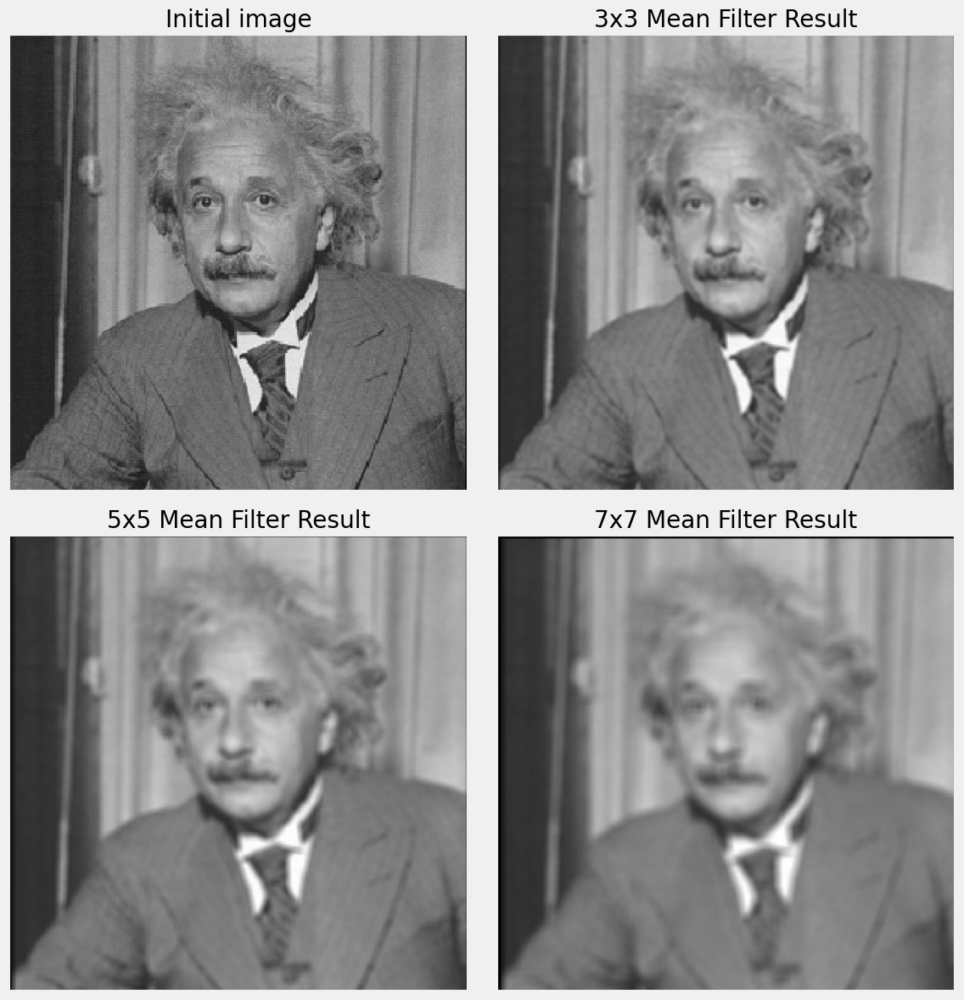

In [15]:
"""
Compare Different dimensions for mean kernel
"""
img = cv2.imread("../dataset/einstein.png")
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)

k_dim = np.array([3,5,7])

fig = plt.figure(figsize=(12, 12))

# Plot Original Image
ax = plt.subplot(2, 2, 1)
ax.title.set_text("Initial image")
plt.imshow(img_gray, "gray")
# Remove grid lines
ax.grid(False)
# Remove axis numbers
plt.xticks([])
plt.yticks([])

i = 2

for dim in k_dim:
    K = get_mean_filter_kernel(dim, dim)
    img_mean_blur = apply_filter(img_gray, K)
    
    ax = plt.subplot(2,2,i)
    ax.title.set_text(f"{dim}x{dim} Mean Filter Result")
    # Remove grid lines
    ax.grid(False)
    # Remove axis numbers
    plt.xticks([])
    plt.yticks([])

    
    plt.imshow(img_mean_blur, "gray")
    i += 1
plt.tight_layout()
# Save Figure to file in original director 
figName = "../dataset/Lab2/Part2/mean_filter_comparison.png"
plt.savefig(figName)
plt.show()

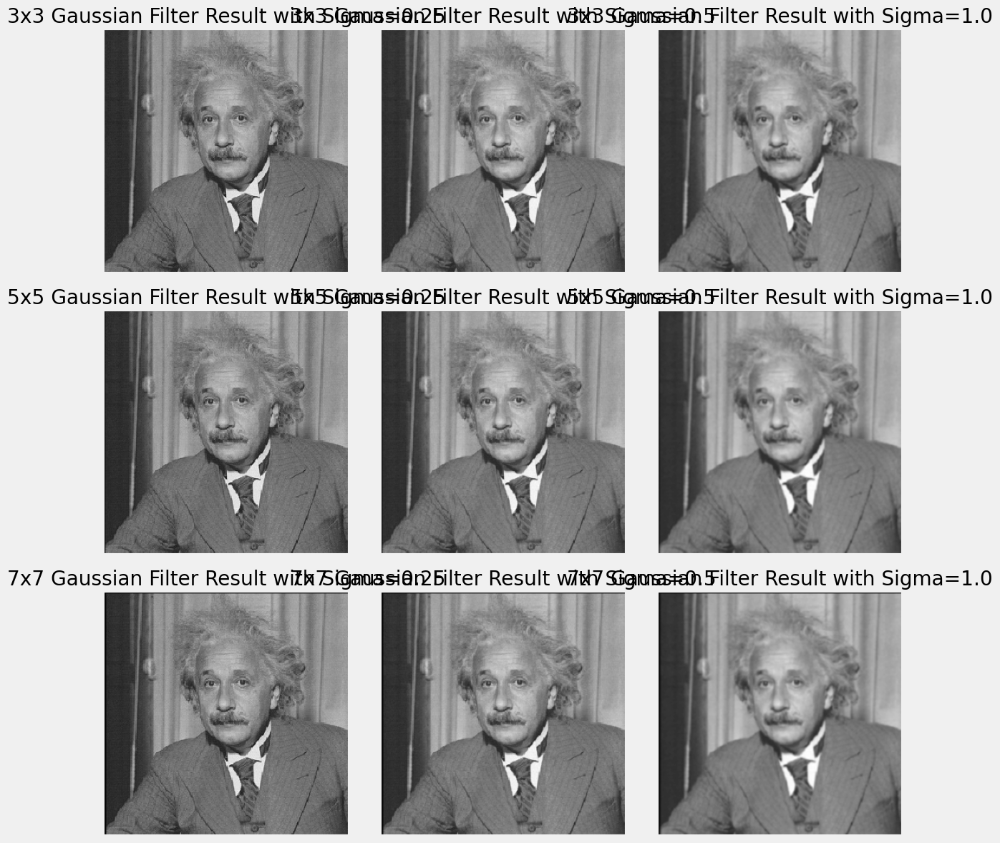

In [18]:
"""
Compare Different Sigma for Gaussain kernel
"""
img = cv2.imread("../dataset/einstein.png")
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)

k_dim = np.array([3,5,7])
sigmas = np.array([0.25,0.5,1.0])

fig = plt.figure(figsize=(12, 12))

# # Plot Original Image
# ax = plt.subplot(2, 2, 1)
# ax.title.set_text("Initial image")
# plt.imshow(img_gray, "gray")
# # Remove grid lines
# ax.grid(False)
# # Remove axis numbers
# plt.xticks([])
# plt.yticks([])

# i = 2
i = 1
for dim in k_dim:
    for sig in sigmas:
        K = get_gaussian_kernel(dim, dim, sig)
        img_gaussian = apply_filter(img_gray, K)
        ax = plt.subplot(len(k_dim),len(sigmas),i)
        ax.title.set_text(f"{dim}x{dim} Gaussian Filter Result with Sigma={sig}")
        # Remove grid lines
        ax.grid(False)
        # Remove axis numbers
        plt.xticks([])
        plt.yticks([])
        
        plt.imshow(img_gaussian, "gray")
        i += 1

# Save Figure to file in original director 
plt.tight_layout()
figName = "../dataset/Lab2/Part2/gaussian_filter_comparison.png"
plt.savefig(figName)
plt.show()

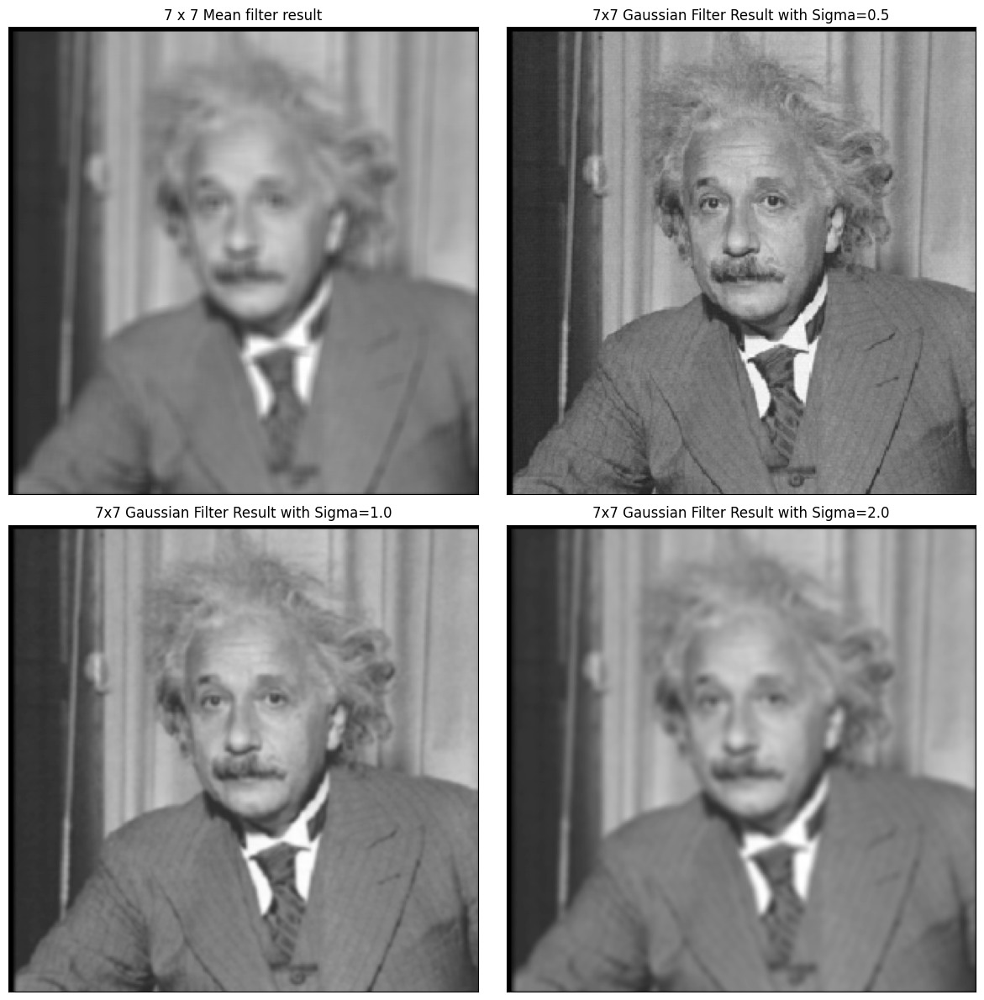

In [ ]:
"""
Get kernels and apply filter here
"""
dim = 7

img = cv2.imread("../dataset/einstein.png")
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)
sigmas = np.array([0.5,1.0,2.0])


"""
Plot the results
"""

K = get_mean_filter_kernel(dim, dim)
img_mean_blur = apply_filter(img_gray, K)

# Plot Mean Kernel Image
fig = plt.figure(figsize=(12, 12))
ax = plt.subplot(2, 2, 1)
ax.title.set_text("7 x 7 Mean filter result")
plt.imshow(img_mean_blur, "gray")
# Remove grid lines
ax.grid(False)
# Remove axis numbers
plt.xticks([])
plt.yticks([])

i = 2
for sig in sigmas:
    K = get_gaussian_kernel(dim, dim, sig)
    img_gaussian = apply_filter(img_gray, K)
    ax = plt.subplot(2,2,i)
    ax.title.set_text(f"{dim}x{dim} Gaussian Filter Result with Sigma={sig}")
    # Remove grid lines
    ax.grid(False)
    # Remove axis numbers
    plt.xticks([])
    plt.yticks([])
    
    plt.imshow(img_gaussian, "gray")
    i += 1

plt.tight_layout()
# Save Figure to file in original director 
figName = "../dataset/Lab2/Part2/filter_method_comparison.png"
plt.savefig(figName)
plt.show()


## Task 5: Edge Detection with Sobel Filter
The Sobel filter is commonly used to detect edges in images by calculating the gradient of the image intensity. It emphasizes areas of high spatial frequency that correspond to edges. Here, we will apply the Sobel filter to detect edges in the grayscale image of Albert Einstein.

We start by applying separate Sobel filters in both the x and y directions, which will highlight horizontal and vertical edges, respectively. The combined result will provide a comprehensive edge map of the entire image.



### Tasks:
* Use your own kernel and extract edge on x and y with sobel filter with only numpy.
* Using the package - *time* does your algorithm compare to the built-in median filtering of opencv? Also, measure the time difference and compare result from your implementation and opencv

In [123]:
# My Own Sobel Filter
def sobel_kernel():
    """Generate Sobel X and Sobel Y kernels."""
    
    # Sobel X Kernel (for detecting horizontal edges)
    sobel_x = np.array([
        [-1, 0, 1],
        [-2, 0, 2],
        [-1, 0, 1]
    ])
    
    # Sobel Y Kernel (for detecting vertical edges)
    sobel_y = np.array([
        [-1, -2, -1],
        [ 0,  0,  0],
        [ 1,  2,  1]
    ])
    return sobel_x, sobel_y

def sobel_filter(img, x_or_y):
    sobel_x, sobel_y = sobel_kernel()
    I = np.zeros_like(img)
    if x_or_y == 'x':
        I = apply_filter(img, sobel_x)
    elif x_or_y == 'y':
        I = apply_filter(img, sobel_y)
    
    return I

def combine_sobel(sobel_x, sobel_y):
    return np.sqrt(sobel_x**2 + sobel_y**2)

OpenCV Function Required: 0.0007281303405761719 seconds
Custom Function Required: 0.37614917755126953 seconds


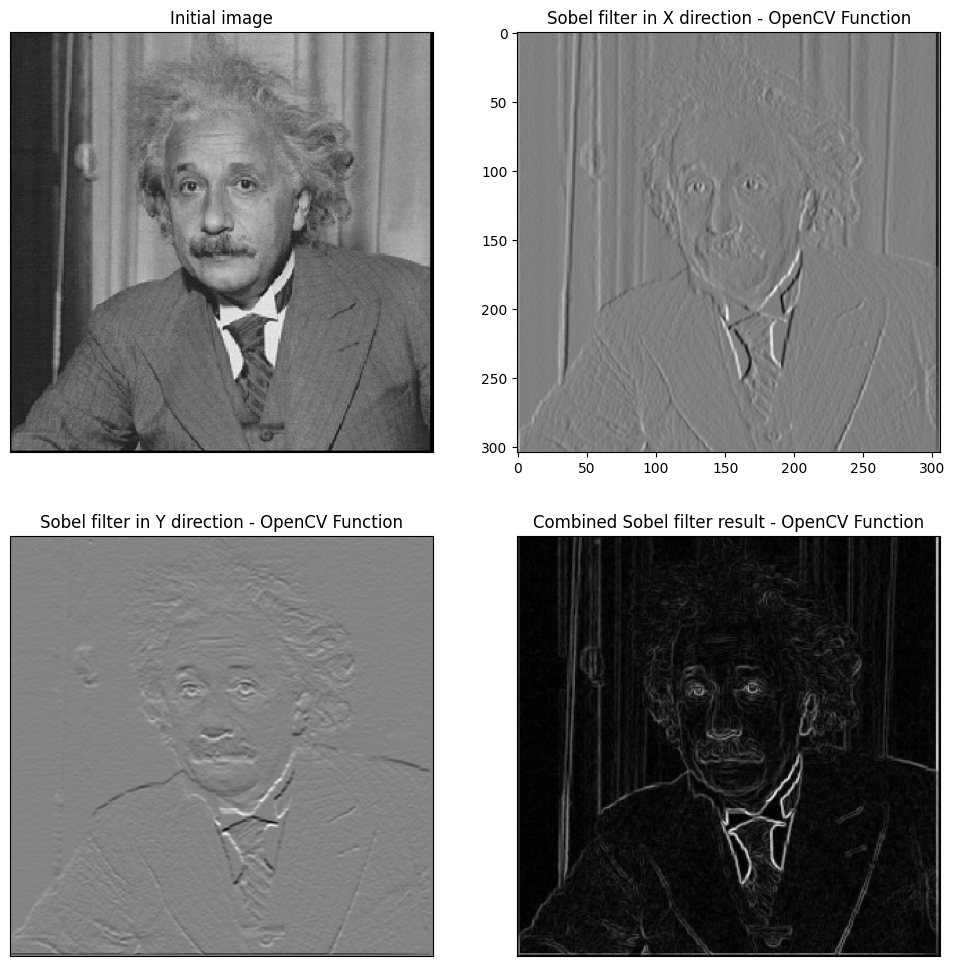

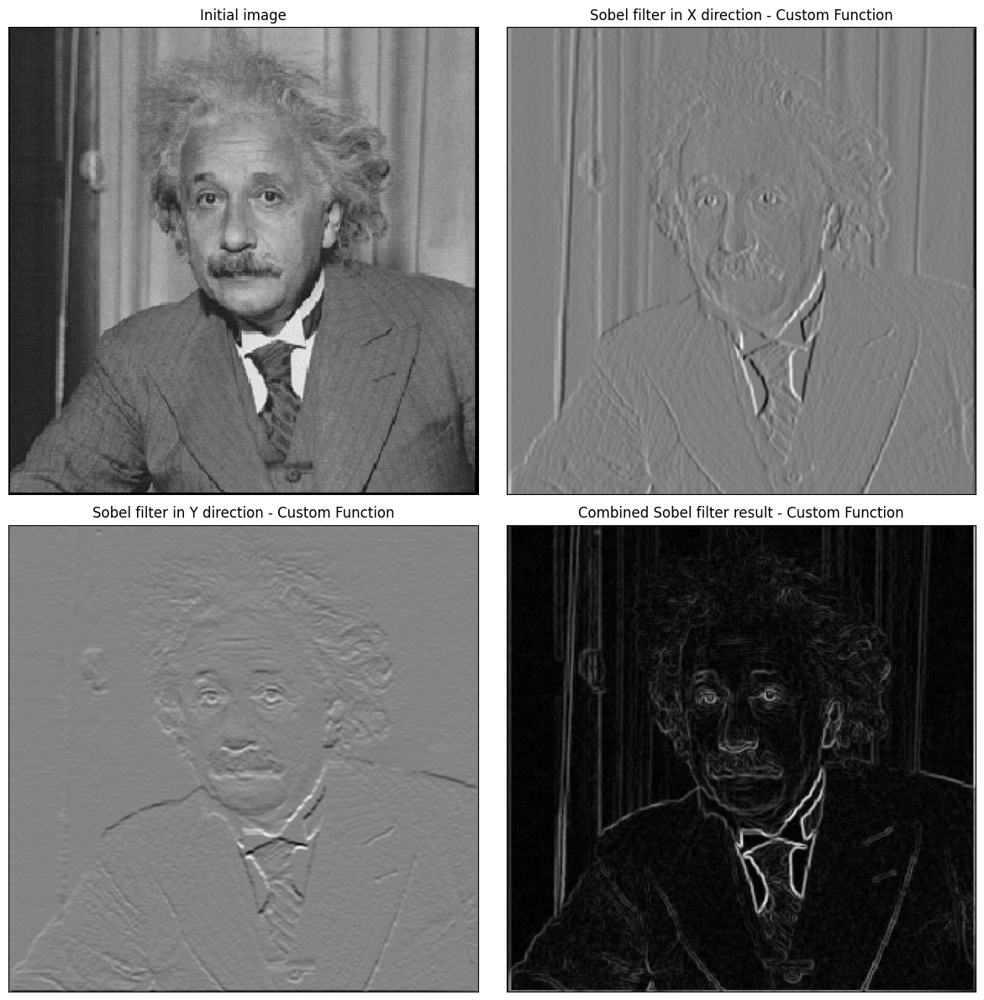

In [127]:
import time
# Import and convert image to gray scale
img = cv2.imread("../dataset/einstein.png")
# img = cv2.imread("../dataset/blackCube.jpg")
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)

# Apply built-in sobel filter
start_time = time.time() # Start timer
sobel_x = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=3)  # Sobel filter in x direction
sobel_y = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=3)  # Sobel filter in y direction
sobel_combined = cv2.magnitude(sobel_x, sobel_y)  # Combine the gradients
t_builtin = time.time() - start_time # Calculated Elapsed Time

# Apply custom sobel filter
start_time = time.time() # Restart timer
sobel_x_ = sobel_filter(img_gray, 'x')
sobel_y_ = sobel_filter(img_gray, 'y')
sobel_combined_ = combine_sobel(sobel_x_, sobel_y_)
t_custom = time.time() - start_time # Calculate Elapsed Time

# Print Comparison
print(f'OpenCV Function Required: {t_builtin} seconds')
print(f'Custom Function Required: {t_custom} seconds')

## Plotting ##
# Built-in
fig = plt.figure(figsize=(12, 12))
ax1 = plt.subplot(2, 2, 1)
ax1.title.set_text("Initial image")
plt.imshow(img_gray, "gray")
plt.xticks([])
plt.yticks([])
ax2 = plt.subplot(2, 2, 2)
ax2.title.set_text("Sobel filter in X direction - OpenCV Function")
plt.imshow(sobel_x, "gray")
ax3 = plt.subplot(2, 2, 3)
plt.xticks([])
plt.yticks([])
ax3.title.set_text("Sobel filter in Y direction - OpenCV Function")
plt.imshow(sobel_y, "gray")
ax4 = plt.subplot(2, 2, 4)
plt.xticks([])
plt.yticks([])
ax4.title.set_text("Combined Sobel filter result - OpenCV Function")
plt.imshow(sobel_combined, "gray")
plt.xticks([])
plt.yticks([])
plt.show()

# Custom
fig = plt.figure(figsize=(12, 12))
ax1 = plt.subplot(2, 2, 1)
ax1.title.set_text("Initial image")
plt.imshow(img_gray, "gray")
plt.xticks([])
plt.yticks([])
ax2 = plt.subplot(2, 2, 2)
ax2.title.set_text("Sobel filter in X direction - Custom Function")
plt.imshow(sobel_x_, "gray")
plt.xticks([])
plt.yticks([])
ax3 = plt.subplot(2, 2, 3)
ax3.title.set_text("Sobel filter in Y direction - Custom Function")
plt.imshow(sobel_y_, "gray")
plt.xticks([])
plt.yticks([])
ax4 = plt.subplot(2, 2, 4)
ax4.title.set_text("Combined Sobel filter result - Custom Function")
plt.imshow(sobel_combined_, "gray")
plt.xticks([])
plt.yticks([])

plt.tight_layout()
figName = "../dataset/Lab2/Part2/sobel_filter_implementation.png"
plt.savefig(figName)

plt.show()


# Part 3: Corner Detection

In the second lecture of the week we went through about corner detection algorithms and how these can be used to find
interesting features on an image that can be used in applications such as stereo matching,
3D reconstruction, tracking, localization and recognition.
Our task here is to code two corner detection algorithms, the Moravec and the Harris
corner detector.

In [3]:
import numpy as np
import copy
import cv2
from matplotlib import pyplot as plt
import random
from PIL import Image
#to visualize the plots within the notebook
%matplotlib inline
# for making plots looking nicer
plt.style.use('fivethirtyeight')

## Task 6: Moravec corner detector

The Moravec corner detector uses a patch centred on each pixel as its own matching
template. The patch is shifted so that it is centred on each of the 8 neighbours of the pixel
and the sum of squared differences (SSD) is calculated between the original patch and the
shifted patch:

$$
    E = \sum_{\Delta \mathbf{x}} w(\Delta \mathbf{x})\big(I(\mathbf{x} + \Delta \mathbf{x}) - I(\mathbf{x}^{\prime} + \Delta \mathbf{x}\big)^2
$$


$w$ is a weighting function with the same dimension as the patch, you can use a Gaussian or constant weights. The corner metric (cornerness) is then taken to be the minimum of the SSD values calculated for each of the eight shifts of the window.
A pixel is marked as a corner if its cornerness is above a user-specified threshold.


Your task is to write your implementation of the Moravec corner detector.
It will take as input a grayscale image, the window size, the threshold and optionally a Gaussian function for $w$. It will give as output a corner map as a list of pixel coordinates where a corner is detected.


In [5]:
def draw_corners(image, corners_map, color=(255, 0, 0)): 
    """Draw a point for each possible corner.
    color image: [H, W, 3]
    corners_map: list of pixel coordinates (xy indexing)
    """
    
    color_img = cv2.cvtColor(image[:,:,0], cv2.COLOR_GRAY2BGR)
    for corner in corners_map:
        cv2.circle(color_img, corner, 1, color, -1) # parameters: image, center, radius, color, thickness
    return color_img

def make_mean_filter_kernel(h, w):
    return np.ones((h, w)) / (h * w) # Normalized mean kernel

def make_gaussian_kernel(h, w, sigma):
    assert (h % 2 == 1) and (w % 2 == 1), print("kernal size must be odd number!") # Check if kernel size is odd
    
    x = np.arange(-(h // 2), h // 2 + 1, 1.) # Create x values
    y = np.arange(-(w // 2), w // 2 + 1, 1.) # Create y values
    xx, yy = np.meshgrid(x, y) # Create meshgrid
    two_sigma_2 = 2 * sigma ** 2 # Calculate 2 * sigma^2
    G = np.exp(-(xx ** 2 + yy ** 2) / two_sigma_2) / (two_sigma_2 * np.pi) # Calculate Gaussian kernel
    G /= G.sum() # Normalize the kernel
    return G

def SSD(patch1, patch2, weight):
    return (weight * (patch1 - patch2) ** 2).sum()

def moravec(image, window_size=3, threshold=100., weights=None):
    """Moravec's corner detection for each pixel of the image.
    image: grayscale image: [H, W]
    """
    assert window_size % 2 == 1, "window size should be an odd number" # Check if window size is odd
    
    neighbours = [(-1, 0), (1, 0), (0, -1), (0, 1), (-1, -1), (-1, 1), (1, -1), (1, 1)] # 8-neighbours: W, E, N, S, NW, NE, SW, SE
    if weights is None:
        weights = make_mean_filter_kernel(window_size, window_size) # Normalized mean kernel
    
    corners = [] # List to store corner coordinates

    k = window_size // 2 # Half of the window size (integer division, ignored remainder)

    H, W = image.shape[0], image.shape[1] # Get the height and width of the image
    # For each pixel in the image
    for i in range(0, H):
        for j in range(0, W):
            
            if i-k < 0 or j-k < 0 or i+k >= H or j+k >= W: # Check if the window is out of bounds
                continue # Skip the current iteration

            centre_patch = image[i-k:i+k+1, j-k:j+k+1]

            E = []
            for nei in neighbours:
                di, dj = nei # Get the neighbour coordinates
                ii, jj = i + di, j + dj # Get the neighbour pixel coordinates

                if ii-k < 0 or jj-k < 0 or ii+k >= H or jj+k >= W: # Check if the window is out of bounds
                    continue # Skip the current iteration

                patch = image[ii-k:ii+k+1, jj-k:jj+k+1] # Get the neighbour patch

                E.append(SSD(centre_patch, patch, weights)) # Calculate the SSD and append to the list
                
            minE = np.array(E).min()
            if minE > threshold:
                corners.append((j, i))

    return corners

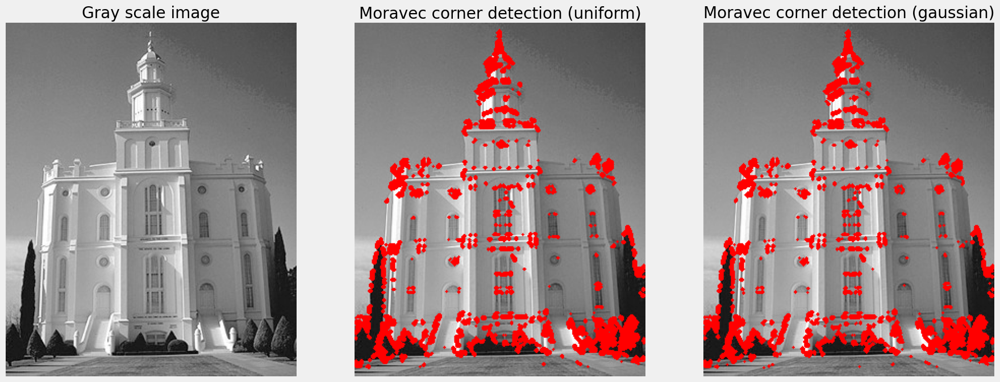

In [21]:
img = cv2.imread('../dataset/building.png')
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32)

moravec_corners = moravec(gray_img, threshold=200.)
img_with_corner = draw_corners(img, moravec_corners)

moravec_corners2 = moravec(gray_img, threshold=200., weights=make_gaussian_kernel(3, 3, 1.0))
img_with_corner2 = draw_corners(img, moravec_corners2)

# Show Original and detected corners on image
fig, axis = plt.subplots(1, 3, figsize=(20, 8), sharey=False)
axis[0].imshow(gray_img, 'gray')
axis[0].grid(False)
axis[0].set_title('Gray scale image')
axis[0].set_axis_off()

axis[1].imshow(img_with_corner, 'gray')
axis[1].grid(False)
axis[1].set_title('Moravec corner detection (uniform)')
axis[1].set_axis_off()

axis[2].imshow(img_with_corner2, 'gray')
axis[2].grid(False)
axis[2].set_title('Moravec corner detection (gaussian)')
axis[2].set_axis_off()

plt.show()

## Task 7: Harris corner detector

The Harris corner detector builds upon the concepts of the Moravec corner detector, but
overcomes its limitations by generalising the measure of cornerness.
The basic limitation of the Moravec detector is that it only calculates cornerness for the 8 main directions
corresponding to the neighbours of a pixel, which means it will not detect a corner in any other direction.
The Harris detector uses the image structure tensor to overcome this. The image structure tensor is:

$$
    S = 
    \begin{pmatrix}
     I^2_x   & I_x I_y\\
     I_x I_y & I^2_y
    \end{pmatrix}
$$

where $I_x$ is the partial derivative of the image in the x direction and $I_y$ is the partial derivative of the image in the y direction.
The structure tensor summarizes the main directions of the gradient of the image for every pixel and therefore its two eigenvalues can be used to determine whether there is a corner at a pixel (if both eigenvalues are large).
The cornerness response metric is then defined as follows:

$$
    C = \text{det}(S) - k \text{tr}(S)^2 \\
$$

where $k$ is a an empirically determined hyper-parameter, usually in the range of $[0.04, 0.06]$

### Non-maximum Suppression (NMS)

In most cases, naivly thresholding the response map will lead to a lot of false-positives, i.e. blobs around real corners. One way to mitigate this to use Non-maximum Suppression (NMS). There is a number of ways of doing it, but the principle is to only keep the pixel with maxium response for aby local regions. You can try by simply setting pixels that have an 8 neighbour with higher cornerness to zero.

In [12]:
"""
Utility functions here, you can use code from the last week. FFT implementation is reccomended as it is faster.
"""
def apply_filter(src_img, kernel):
    '''
    Implement filtering algorithm
    :param src_img: gray scaled source image with size HxW
    :param kernel: kernel to be applied to the source image
    :return rst_img: filtered image
    '''    
    assert len(src_img.shape) == 2, print("Dimension mismatch! Please supply gray-scale image only!")
    assert len(kernel.shape) == 2, print("Dimension mismatch! Please supply 2D kernel only!")
    Kn, Km = kernel.shape
    assert (Kn % 2 == 1) and (Km % 2 == 1), print("kernal size must be odd number!")
    N = (Kn - 1)//2 
    M = (Km - 1)//2

    I = copy.deepcopy(src_img) # Copy original image
    Id = np.zeros_like(I) # Filtered Image Holder
    Iaug = cv2.copyMakeBorder(I, N, N, M, M, borderType=cv2.BORDER_REPLICATE) # Expanded I image
    
    H, W = I.shape
    
    # for each pixel 
    for i in range(N,H):
        for j in range(M,W):
            segment = Iaug[i-N:i+N+1, j-M:j+M+1]
            # print(f'segment is of shape{segment.shape}')
            Id[i,j] = np.sum(segment * kernel) # Multiply and add segment end kernel elements

    return Id


def get_gaussian_kernel_mesh(h, w, sigma):
    '''
    Get kernel of Gaussian filter
    '''
    assert (h % 2 == 1) and (w % 2 == 1), print("kernal size must be odd number!") # Check if kernel size is odd
    x_mid = (h-1)/2 # Center of the rows
    y_mid = (w-1)/2 # Center of the columns
    x = np.arange(-x_mid, x_mid + 1, 1.) # Create x values
    y = np.arange(-y_mid, y_mid + 1, 1.) # Create y values
    X, Y = np.meshgrid(x, y) # Create meshgrid: all possible combinations of x and y
    kernel = np.exp(-(X**2 + Y**2) / (2 * sigma**2)) / (2 * np.pi * sigma**2) # Calculate Gaussian kernel
    kernel /= kernel.sum() # Normalize the kernel
    return kernel

def apply_gaussian_filter(src_img, k=5, sigma=1.0):
    '''
    Implement Gaussian filtering algorithm
    :param src_img: gray scaled source image with size HxW
    :param k: kernel size
    :param sigma: standard deviation
    :return rst_img: filtered image
    '''
    kernel = get_gaussian_kernel_mesh(k, k, sigma)
    return apply_filter(src_img, kernel)

def get_mean_filter_kernel(h, w):
    '''
    Get kernel of mean filter
    '''
    assert (h % 2 == 1) and (w % 2 == 1), print("kernal size must be odd number!")
    return np.ones((h,w))/(h*w)


def gradientX(image):
    # Sobel X Kernel (for detecting horizontal edges)
    kernel = np.array([[-1., 0., 1.],
                       [-2., 0., 2.],
                       [-1., 0., 1.]]) / 9.
    filtered_image = apply_filter(image, kernel)
    return filtered_image

def gradientY(image):
    # Sobel Y Kernel (for detecting vertical edges)
    kernel = np.array([[-1., -2., -1.],
                       [0., 0., 0.],
                       [1., 2., 1.]]) / 9.
    filtered_image = apply_filter(image, kernel)
    return filtered_image


def nms(response, threshold):
    """
    Perform non-maximum suppression on the Harris corner response.
    response: Harris corner response: [H, W]
    threshold: threshold for corner detection
    window_size: window size for non-maximum suppression
    """
    H, W = response.shape
    
    # 8 neighbors
    neighbors = [(0, -1), (0, 1), (-1, 0), (1, 0), (-1, -1), (-1, 1), (1, -1), (1, 1)]
    
    # for each pixel, check the response value of the pixel and its neighbors
    corners = []
    for i in range(1, H-1): # Skip the first and last rows
        for j in range(1, W-1): # Skip the first and last columns
            if response[i, j] > threshold: # Check if the response value is greater than the threshold
                is_max = True # Flag to check if the pixel is a local maximum

                for di, dj in neighbors:
                    if response[i, j] < response[i + di, j + dj]:
                        is_max = False
                        break

                if is_max:
                    corners.append((j, i))
    
    return corners


def harris(image, threshold=100., k=0.04):
    """Harris's corner detection for each pixel of the image.
    image: grayscale image: [H, W]
    """
    H, W = image.shape[0], image.shape[1] # Get the height and width of the image
    
    corners = [] # List to store corner coordinates

    S = np.zeros_like(image) # Initialize the structure tensor

    Ix = gradientX(image) # Compute the gradient in the x direction
    Iy = gradientY(image) # Compute the gradient in the y direction

    Sxx = Ix ** 2 # Compute the structure tensor Sxx
    Syy = Iy ** 2 # Compute the structure tensor Syy
    Sxy = Ix * Iy # Compute the structure tensor Sxy

    Gxx = apply_gaussian_filter(Sxx, k=5, sigma=1.0) # Apply Gaussian filter to Sxx
    Gyy = apply_gaussian_filter(Syy, k=5, sigma=1.0) # Apply Gaussian filter to Syy
    Gxy = apply_gaussian_filter(Sxy, k=5, sigma=1.0) # Apply Gaussian filter to Sxy

    det_S = Gxx * Gyy - Gxy ** 2 # Compute the determinant of the structure tensor S
    trace_S = Gxx + Gyy # Compute the trace of the structure tensor S
    C = det_S - k * trace_S ** 2 # Compute the Harris response C

    # S = np.stack((Sxx, Sxy, Sxy, Syy), axis=-1).reshape(H, W, 2, 2) # Stack the structure tensors
    print(f'shape of S is {S.shape}') # H x W x 2 x 2 :: 4 S values for each pixel
    
    # det_s = np.linalg.det(S) # Compute the determinant of the structure tensor S :: H x W
    # trace_s = np.trace(S, axis1=2, axis2=3) # Compute the trace along the last two dimensions of the structure tensor S :: H x W
    # C = det_s - k * trace_s ** 2 # Compute the Harris response C :: H x W
    # Get pixels with a Harris response greater than the threshold
    # C_abs = np.abs(C) 
    
    corners = np.argwhere(C > threshold)
    corners = [(x, y) for y, x in corners]
    return corners, C



Image shape is (348, 286)
shape of S is (348, 286)


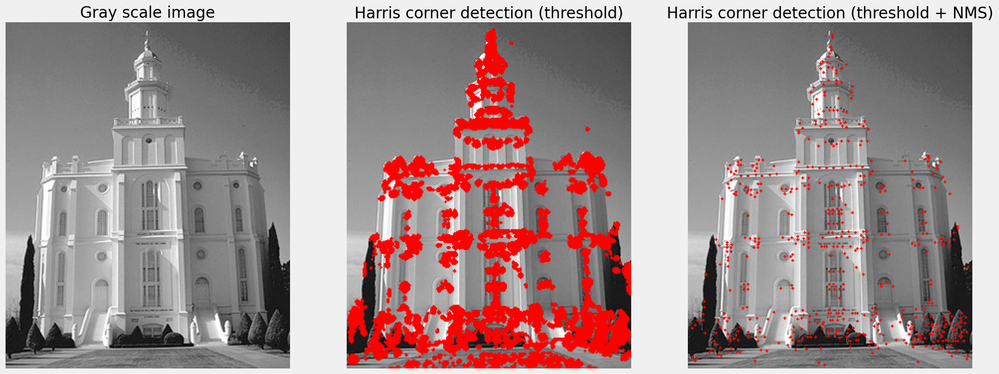

In [13]:
img = cv2.imread('../dataset/building.png')
k = 0.05 # Empirical constant for Harris corner detector k \in [0.04, 0.06]
threshold = 2000. # Threshold for corner detection
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY).astype(np.float32) # Convert the image to gray scale
H, W = gray_img.shape # Get the height and width of the image
print(f'Image shape is {gray_img.shape}')

# Write your code here:
corners, C = harris(gray_img, k=k)
harris_img_corner = draw_corners(img, corners)

# corners after NMS
corners_nms = nms(C, threshold=threshold)
harris_img_corner_nms = draw_corners(img, corners_nms)
# print(f'corner shape is {corners_nms.shape}')

# Show Original and detected corners on image
fig, axis = plt.subplots(1, 3, figsize=(20, 8), sharey=False)
axis[0].imshow(gray_img, 'gray')
axis[0].grid(False)
axis[0].set_title('Gray scale image')
axis[0].set_axis_off()

axis[1].imshow(harris_img_corner, 'gray')
axis[1].grid(False)
axis[1].set_title('Harris corner detection (threshold)')
axis[1].set_axis_off()

axis[2].imshow(harris_img_corner_nms, 'gray')
axis[2].grid(False)
axis[2].set_title('Harris corner detection (threshold + NMS)')
axis[2].set_axis_off()

plt.show()

# Part 4 Feature extraction and Matching


## Task 8 SIFT Feature Detection and Matching

#### Step 1: SIFT Feature Detection and Visualization
Here we demonstrates how SIFT detects features in a single image:
- Loads and preprocesses the image
- Detects SIFT keypoints
- Visualizes the keypoints on the image
- Shows keypoint orientations and scales

#### Step 2: Feature Matching Between Images
Here we show how SIFT features are matched between two images:
- Detects features in both images
- Matches features using ratio test
- Visualizes the matching results with lines connecting matched points
- Shows match distance distribution

### Tasks:

1. With the example provided:
   1.  Vary the paratmeter on  'max_image_size', 'max_features', 'ratio_thresh' to see their impact on perforamnce, such as matching reuslt and time consumption.

2. Capture your own image pair with:
   1. Slight variation of angle and match them
   2. Big variation of angle and match them
   3. Different time of the day or lighting variation and match them
   4. With one image using your phone or laptop webcam and match them

3. Compare Harris detector result with SIFT and FAST (https://docs.opencv.org/3.4/df/d0c/tutorial_py_fast.html)


In [109]:
import cv2
import time
import numpy as np
import matplotlib.pyplot as plt

#### Common Functions

In [112]:
# Common Functions
def load_image(image_path, max_size):
    """Load and resize image if too large"""
    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(f"Could not load image: {image_path}")
    
    # Resize if image is too large
    h, w = img.shape[:2]
    if max(h, w) > max_size:
        scale = max_size / max(h, w)
        new_size = (int(w * scale), int(h * scale))
        img = cv2.resize(img, new_size, interpolation=cv2.INTER_AREA)
    
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    return img_gray, img_rgb

def visualize_features(img_rgb, keypoints, title="SIFT Features"):
    """Visualize SIFT features with circles and orientations"""
    img_with_kp = img_rgb.copy()
    
    for kp in keypoints:
        x, y = int(kp.pt[0]), int(kp.pt[1])
        size = int(kp.size)
        angle = kp.angle * np.pi / 180.0
        
        cv2.circle(img_with_kp, (x, y), size, (0, 255, 0), 1)
        end_x = int(x + size * np.cos(angle))
        end_y = int(y + size * np.sin(angle))
        cv2.line(img_with_kp, (x, y), (end_x, end_y), (0, 255, 0), 1)
    
    plt.figure(figsize=(12, 8))
    plt.imshow(img_with_kp)
    plt.title(f"{title}\n{len(keypoints)} keypoints detected")
    plt.axis('off')
    plt.tight_layout()

    
def visualize_matches(img1_rgb, img2_rgb, keypoints1, keypoints2, good_matches, 
                     distances, max_display_matches):
    """Visualize feature matches between images"""
    good_matches = sorted(good_matches, key=lambda x: x.distance)[:max_display_matches]
    
    plt.figure(figsize=(12, 6))
    
    # Plot histogram
    plt.subplot(1, 2, 1)
    plt.hist(distances, bins=30, color='blue', alpha=0.7)
    plt.title(f"Match Distances\n({len(good_matches)} shown of {len(distances)} matches)")
    plt.xlabel("Distance")
    plt.ylabel("Count")
    
    # Draw matches
    match_img = cv2.drawMatches(
        img1_rgb, keypoints1,
        img2_rgb, keypoints2,
        good_matches, None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS,
        matchColor=(0, 255, 0)
    )
    
    plt.subplot(1, 2, 2)
    plt.imshow(match_img)
    plt.title("SIFT Matches")
    plt.axis('off')
    plt.tight_layout()


In [113]:
def detect_features(img, max_features):
    """Detect SIFT features"""
    sift = cv2.SIFT_create(nfeatures=max_features)
    keypoints, descriptors = sift.detectAndCompute(img, None)
    return keypoints, descriptors


In [114]:
def match_features(descriptors1, descriptors2, ratio_thresh):
    """Match features using BFMatcher with ratio test"""
    bf = cv2.BFMatcher(cv2.NORM_L2)
    matches = bf.knnMatch(descriptors1, descriptors2, k=2)
    
    good_matches = []
    distances = []
    for m, n in matches:
        if m.distance < ratio_thresh * n.distance:
            good_matches.append(m)
            distances.append(m.distance)
    
    return good_matches, distances

#### Extract Feature Points


=== Stage 1: Single Image SIFT Detection ===
Image size: (554, 800, 3)
Processing time: 0.113 seconds
Features detected: 1000


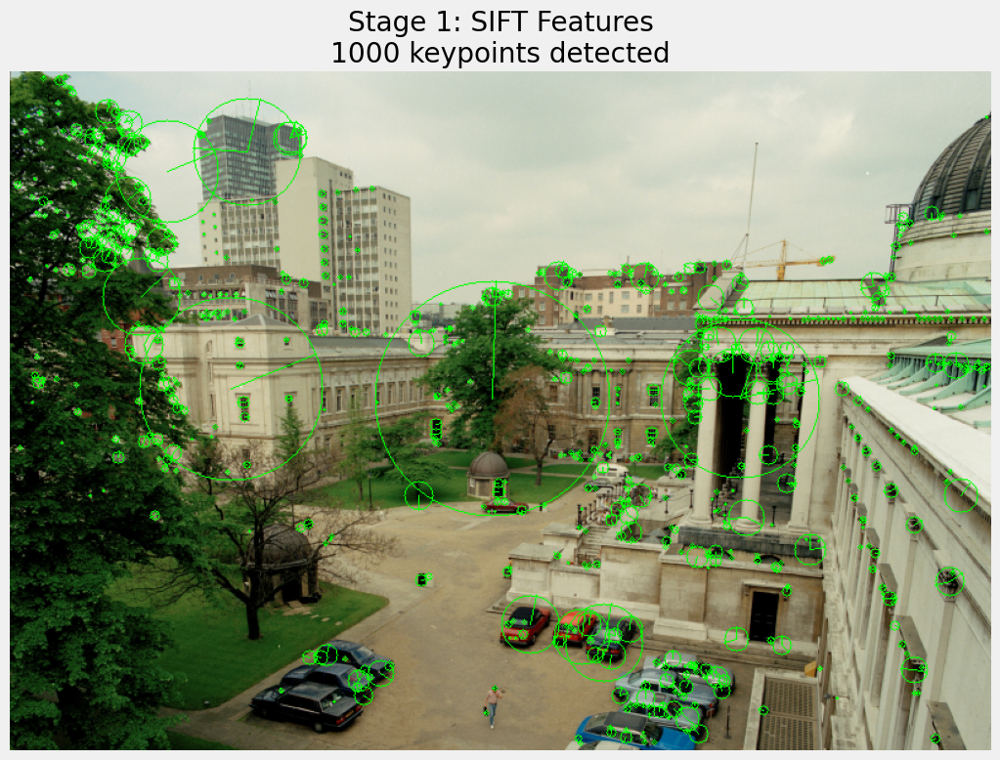

In [115]:
# Parameters for Stage 1
params = {
    'max_image_size': 800,
    'max_features': 1000,
}

# Image path
img_path = '../dataset/UCL_21May91.jpg'

print("\n=== Stage 1: Single Image SIFT Detection ===")

# Load and process image
t0 = time.time()
img_gray, img_rgb = load_image(img_path, params['max_image_size'])
print(f"Image size: {img_rgb.shape}")

# Detect features
keypoints, descriptors = detect_features(img_gray, params['max_features'])
t1 = time.time()

print(f"Processing time: {t1-t0:.3f} seconds")
print(f"Features detected: {len(keypoints)}")

# Visualize
visualize_features(img_rgb, keypoints, "Stage 1: SIFT Features")
plt.show()

#### Match feature Points 


=== Stage 2: Feature Matching ===
Image 1 features: 1000
Image 2 features: 1001
Processing time: 0.199 seconds
Matches found: 104 good matches


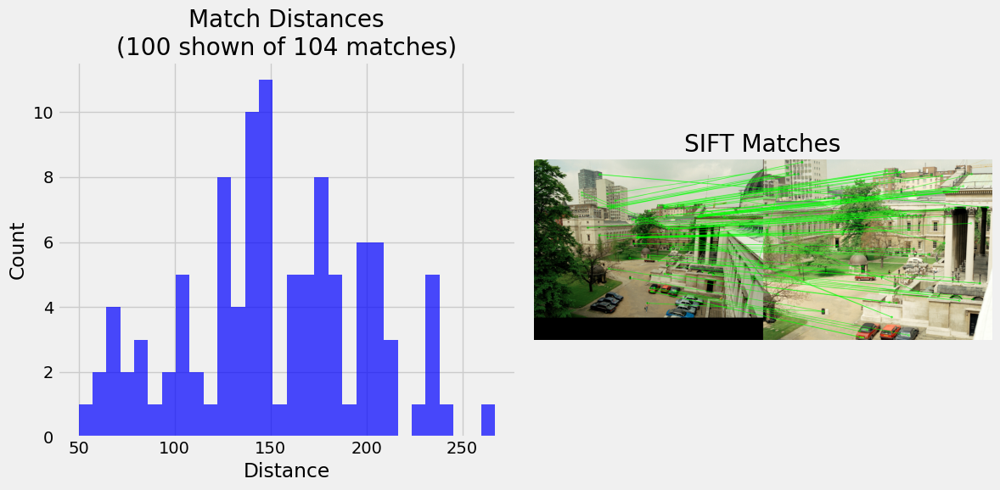

In [116]:
# Parameters for Stage 2
params = {
    'max_image_size': 800,
    'max_features': 1000,
    'ratio_thresh': 0.75,
    'max_display_matches': 100
}
# Image paths
img1_path = '../dataset/UCL_21May91.jpg'
img2_path = '../dataset/UCLQuad_21May91.jpg'

print("\n=== Stage 2: Feature Matching ===")

# Load and process first image
t0 = time.time()
img1_gray, img1_rgb = load_image(img1_path, params['max_image_size'])
keypoints1, descriptors1 = detect_features(img1_gray, params['max_features'])
print(f"Image 1 features: {len(keypoints1)}")

# Load and process second image
img2_gray, img2_rgb = load_image(img2_path, params['max_image_size'])
keypoints2, descriptors2 = detect_features(img2_gray, params['max_features'])
print(f"Image 2 features: {len(keypoints2)}")

# Match features
good_matches, distances = match_features(descriptors1, descriptors2, 
                                       params['ratio_thresh'])
t1 = time.time()

print(f"Processing time: {t1-t0:.3f} seconds")
print(f"Matches found: {len(good_matches)} good matches")

# Visualize matches
visualize_matches(img1_rgb, img2_rgb, keypoints1, keypoints2, 
                good_matches, distances, params['max_display_matches'])
plt.show()